# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

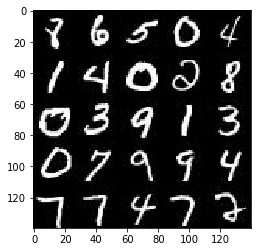

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

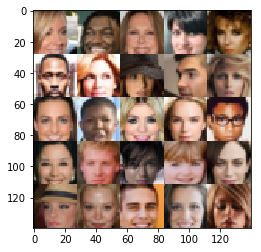

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.6.0-rc0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name="learning_rate")
    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False, alpha=0.01):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """

    def block(x, n_channels, stride):
        x_next = tf.layers.conv2d(x, n_channels, 5, strides=stride, padding='same')
        bn = tf.layers.batch_normalization(x_next, training=True)
        return tf.maximum(alpha * bn, bn)
    
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x3
        x1 = block(images, 64, 2) # 14x14x64
        x2 = block(x1, 128, 2) # 7x7x128
        x3 = block(x2, 256, 2) # 4x4x256

        # Flatten it
        flat = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [15]:
def generator(z, out_channel_dim, is_train=True, alpha = 0.01):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    
    def block(x, n_channels, strides):
        x_next = tf.layers.conv2d_transpose(x, n_channels, 5, strides=strides, padding='same')
        x_next = tf.layers.batch_normalization(x_next, training=is_train)
        return tf.maximum(alpha * x_next, x_next)
    
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now
        
        x2 = block(x1, 256, 2) # 14x14x256 now
        x2 = block(x2, 128, 1) # 14x14x128 now
        x2 = block(x2, 64, 1) # 14x14x64 now
        x2 = block(x2, 32, 1) # 14x14x32 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x3 now
        
        return tf.tanh(logits)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """    
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode, show_every=100, print_every=10):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    _, image_width, image_height, image_channels = data_shape
    
    # TODO: Build Model        
    input_real, input_z, input_lr = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, input_lr, beta1)
        
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                batch_images *= 2.0
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, input_lr:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, input_lr:learning_rate})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 16, input_z, image_channels, data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 0.4154... Generator Loss: 7.9415
Epoch 1/2... Discriminator Loss: 0.5055... Generator Loss: 1.7298
Epoch 1/2... Discriminator Loss: 0.7640... Generator Loss: 1.0394
Epoch 1/2... Discriminator Loss: 0.5322... Generator Loss: 1.2598
Epoch 1/2... Discriminator Loss: 3.9354... Generator Loss: 0.0355
Epoch 1/2... Discriminator Loss: 0.5875... Generator Loss: 1.2940
Epoch 1/2... Discriminator Loss: 0.6300... Generator Loss: 1.6862
Epoch 1/2... Discriminator Loss: 0.9282... Generator Loss: 1.7164
Epoch 1/2... Discriminator Loss: 0.8356... Generator Loss: 2.6619
Epoch 1/2... Discriminator Loss: 1.1048... Generator Loss: 0.6406


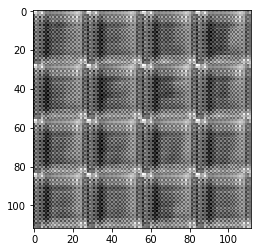

Epoch 1/2... Discriminator Loss: 1.0782... Generator Loss: 0.7068
Epoch 1/2... Discriminator Loss: 0.9257... Generator Loss: 2.4445
Epoch 1/2... Discriminator Loss: 0.8871... Generator Loss: 1.7416
Epoch 1/2... Discriminator Loss: 1.2574... Generator Loss: 0.4992
Epoch 1/2... Discriminator Loss: 0.8949... Generator Loss: 1.2073
Epoch 1/2... Discriminator Loss: 1.1976... Generator Loss: 0.5831
Epoch 1/2... Discriminator Loss: 1.2788... Generator Loss: 0.4293
Epoch 1/2... Discriminator Loss: 1.3569... Generator Loss: 0.5289
Epoch 1/2... Discriminator Loss: 3.0228... Generator Loss: 3.8451
Epoch 1/2... Discriminator Loss: 1.4312... Generator Loss: 0.6113


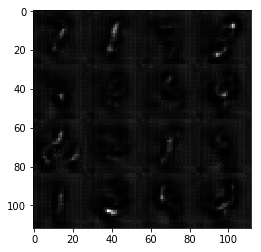

Epoch 1/2... Discriminator Loss: 1.9802... Generator Loss: 1.7942
Epoch 1/2... Discriminator Loss: 1.1442... Generator Loss: 1.4039
Epoch 1/2... Discriminator Loss: 1.1567... Generator Loss: 0.6711
Epoch 1/2... Discriminator Loss: 1.2973... Generator Loss: 0.9020
Epoch 1/2... Discriminator Loss: 1.4639... Generator Loss: 0.3880
Epoch 1/2... Discriminator Loss: 1.1896... Generator Loss: 0.7468
Epoch 1/2... Discriminator Loss: 1.0927... Generator Loss: 0.6872
Epoch 1/2... Discriminator Loss: 1.2532... Generator Loss: 0.6047
Epoch 1/2... Discriminator Loss: 1.1435... Generator Loss: 0.7979
Epoch 1/2... Discriminator Loss: 1.3944... Generator Loss: 0.4674


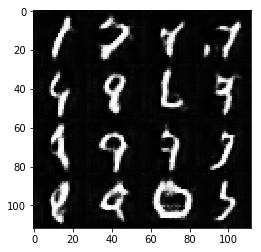

Epoch 1/2... Discriminator Loss: 1.2965... Generator Loss: 1.6071
Epoch 1/2... Discriminator Loss: 1.2415... Generator Loss: 0.4997
Epoch 1/2... Discriminator Loss: 1.1360... Generator Loss: 1.3405
Epoch 1/2... Discriminator Loss: 1.1566... Generator Loss: 0.8571
Epoch 1/2... Discriminator Loss: 1.0109... Generator Loss: 0.9579
Epoch 1/2... Discriminator Loss: 1.4364... Generator Loss: 0.4287
Epoch 1/2... Discriminator Loss: 1.1547... Generator Loss: 0.6473
Epoch 1/2... Discriminator Loss: 1.0932... Generator Loss: 0.6962
Epoch 1/2... Discriminator Loss: 1.5154... Generator Loss: 0.3432
Epoch 1/2... Discriminator Loss: 1.2934... Generator Loss: 0.5520


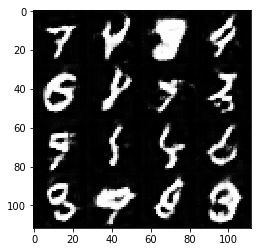

Epoch 1/2... Discriminator Loss: 1.2710... Generator Loss: 0.4938
Epoch 1/2... Discriminator Loss: 1.1703... Generator Loss: 0.6803
Epoch 1/2... Discriminator Loss: 1.1852... Generator Loss: 0.9396
Epoch 1/2... Discriminator Loss: 1.3718... Generator Loss: 0.3974
Epoch 1/2... Discriminator Loss: 1.2111... Generator Loss: 1.1101
Epoch 1/2... Discriminator Loss: 1.2187... Generator Loss: 0.5531
Epoch 1/2... Discriminator Loss: 1.1270... Generator Loss: 0.6307
Epoch 1/2... Discriminator Loss: 1.0046... Generator Loss: 0.8455
Epoch 1/2... Discriminator Loss: 1.0741... Generator Loss: 1.0121
Epoch 1/2... Discriminator Loss: 1.2551... Generator Loss: 0.5990


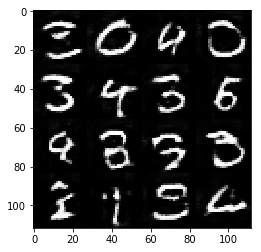

Epoch 1/2... Discriminator Loss: 1.1753... Generator Loss: 1.0182
Epoch 1/2... Discriminator Loss: 1.2434... Generator Loss: 0.5015
Epoch 1/2... Discriminator Loss: 1.7685... Generator Loss: 0.2744
Epoch 1/2... Discriminator Loss: 1.1326... Generator Loss: 0.6690
Epoch 1/2... Discriminator Loss: 1.1803... Generator Loss: 0.8315
Epoch 1/2... Discriminator Loss: 1.1626... Generator Loss: 1.3234
Epoch 1/2... Discriminator Loss: 1.1692... Generator Loss: 0.7584
Epoch 1/2... Discriminator Loss: 1.0279... Generator Loss: 0.9939
Epoch 1/2... Discriminator Loss: 1.1217... Generator Loss: 0.6971
Epoch 1/2... Discriminator Loss: 1.1888... Generator Loss: 0.6166


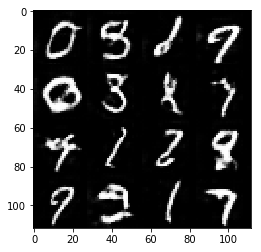

Epoch 1/2... Discriminator Loss: 1.4333... Generator Loss: 0.3969
Epoch 1/2... Discriminator Loss: 1.2548... Generator Loss: 1.3519
Epoch 1/2... Discriminator Loss: 1.1835... Generator Loss: 0.7899
Epoch 1/2... Discriminator Loss: 1.2526... Generator Loss: 0.6063
Epoch 1/2... Discriminator Loss: 1.4049... Generator Loss: 0.4865
Epoch 1/2... Discriminator Loss: 1.0784... Generator Loss: 0.8586
Epoch 1/2... Discriminator Loss: 0.9781... Generator Loss: 1.0285
Epoch 1/2... Discriminator Loss: 1.0110... Generator Loss: 0.7147
Epoch 1/2... Discriminator Loss: 1.2493... Generator Loss: 0.5841
Epoch 1/2... Discriminator Loss: 1.1265... Generator Loss: 0.8386


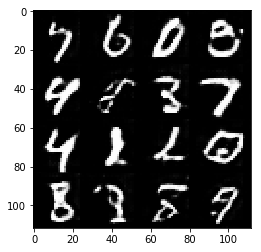

Epoch 1/2... Discriminator Loss: 1.0284... Generator Loss: 0.8333
Epoch 1/2... Discriminator Loss: 1.1247... Generator Loss: 0.8360
Epoch 1/2... Discriminator Loss: 1.1344... Generator Loss: 0.8560
Epoch 1/2... Discriminator Loss: 1.2277... Generator Loss: 0.4749
Epoch 1/2... Discriminator Loss: 1.1930... Generator Loss: 0.6381
Epoch 1/2... Discriminator Loss: 1.2654... Generator Loss: 0.5506
Epoch 1/2... Discriminator Loss: 1.1613... Generator Loss: 1.2026
Epoch 1/2... Discriminator Loss: 1.7868... Generator Loss: 0.2668
Epoch 1/2... Discriminator Loss: 0.9350... Generator Loss: 1.1296
Epoch 1/2... Discriminator Loss: 1.3235... Generator Loss: 0.4648


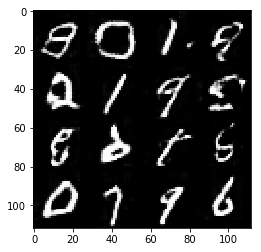

Epoch 1/2... Discriminator Loss: 1.1079... Generator Loss: 0.9009
Epoch 1/2... Discriminator Loss: 1.1686... Generator Loss: 1.6432
Epoch 1/2... Discriminator Loss: 0.9945... Generator Loss: 1.0555
Epoch 1/2... Discriminator Loss: 1.0873... Generator Loss: 0.9956
Epoch 1/2... Discriminator Loss: 1.1354... Generator Loss: 1.0615
Epoch 1/2... Discriminator Loss: 1.2102... Generator Loss: 0.6650
Epoch 1/2... Discriminator Loss: 1.1418... Generator Loss: 1.0436
Epoch 1/2... Discriminator Loss: 1.2212... Generator Loss: 1.3249
Epoch 1/2... Discriminator Loss: 1.4338... Generator Loss: 0.4634
Epoch 1/2... Discriminator Loss: 1.3255... Generator Loss: 0.4823


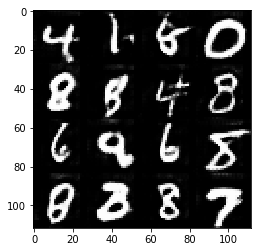

Epoch 1/2... Discriminator Loss: 1.2613... Generator Loss: 0.6274
Epoch 1/2... Discriminator Loss: 0.9932... Generator Loss: 1.2234
Epoch 1/2... Discriminator Loss: 1.0830... Generator Loss: 1.6632
Epoch 2/2... Discriminator Loss: 1.1506... Generator Loss: 0.6925
Epoch 2/2... Discriminator Loss: 1.2311... Generator Loss: 0.6137
Epoch 2/2... Discriminator Loss: 0.9414... Generator Loss: 0.8757
Epoch 2/2... Discriminator Loss: 1.3436... Generator Loss: 0.4275
Epoch 2/2... Discriminator Loss: 1.4245... Generator Loss: 1.3659
Epoch 2/2... Discriminator Loss: 1.1304... Generator Loss: 0.6363
Epoch 2/2... Discriminator Loss: 1.2589... Generator Loss: 2.0397


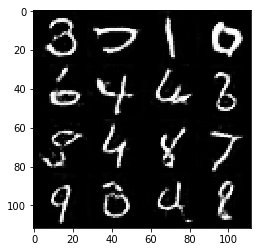

Epoch 2/2... Discriminator Loss: 1.0458... Generator Loss: 0.8381
Epoch 2/2... Discriminator Loss: 1.1132... Generator Loss: 0.8425
Epoch 2/2... Discriminator Loss: 1.2825... Generator Loss: 0.5310
Epoch 2/2... Discriminator Loss: 1.2738... Generator Loss: 0.5677
Epoch 2/2... Discriminator Loss: 1.1836... Generator Loss: 1.1107
Epoch 2/2... Discriminator Loss: 1.1822... Generator Loss: 0.5593
Epoch 2/2... Discriminator Loss: 1.2827... Generator Loss: 0.4948
Epoch 2/2... Discriminator Loss: 1.1598... Generator Loss: 1.2566
Epoch 2/2... Discriminator Loss: 1.0907... Generator Loss: 0.7778
Epoch 2/2... Discriminator Loss: 1.1306... Generator Loss: 0.6250


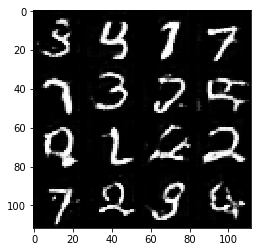

Epoch 2/2... Discriminator Loss: 1.0881... Generator Loss: 0.7938
Epoch 2/2... Discriminator Loss: 1.0783... Generator Loss: 0.9433
Epoch 2/2... Discriminator Loss: 1.1448... Generator Loss: 0.8326
Epoch 2/2... Discriminator Loss: 0.9759... Generator Loss: 0.8794
Epoch 2/2... Discriminator Loss: 1.0551... Generator Loss: 1.0305
Epoch 2/2... Discriminator Loss: 1.1317... Generator Loss: 0.6066
Epoch 2/2... Discriminator Loss: 1.2253... Generator Loss: 1.5273
Epoch 2/2... Discriminator Loss: 1.0566... Generator Loss: 1.1785
Epoch 2/2... Discriminator Loss: 1.6942... Generator Loss: 0.2965
Epoch 2/2... Discriminator Loss: 1.1583... Generator Loss: 0.7387


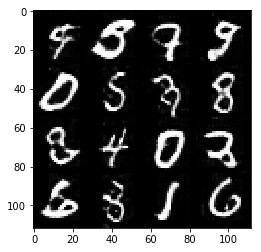

Epoch 2/2... Discriminator Loss: 1.0876... Generator Loss: 0.8695
Epoch 2/2... Discriminator Loss: 1.3651... Generator Loss: 0.4868
Epoch 2/2... Discriminator Loss: 1.3050... Generator Loss: 0.4998
Epoch 2/2... Discriminator Loss: 1.2250... Generator Loss: 0.6693
Epoch 2/2... Discriminator Loss: 1.1847... Generator Loss: 0.7074
Epoch 2/2... Discriminator Loss: 1.4839... Generator Loss: 0.3611
Epoch 2/2... Discriminator Loss: 1.1904... Generator Loss: 0.6746
Epoch 2/2... Discriminator Loss: 0.9790... Generator Loss: 0.8401
Epoch 2/2... Discriminator Loss: 1.1430... Generator Loss: 1.4578
Epoch 2/2... Discriminator Loss: 1.0843... Generator Loss: 1.3832


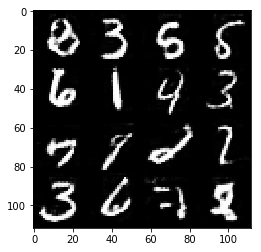

Epoch 2/2... Discriminator Loss: 1.1517... Generator Loss: 1.5835
Epoch 2/2... Discriminator Loss: 1.1319... Generator Loss: 0.8256
Epoch 2/2... Discriminator Loss: 1.1352... Generator Loss: 0.8778
Epoch 2/2... Discriminator Loss: 1.1894... Generator Loss: 0.5668
Epoch 2/2... Discriminator Loss: 1.0685... Generator Loss: 1.2902
Epoch 2/2... Discriminator Loss: 0.8731... Generator Loss: 0.9939
Epoch 2/2... Discriminator Loss: 1.3011... Generator Loss: 0.4748
Epoch 2/2... Discriminator Loss: 1.2598... Generator Loss: 0.5397
Epoch 2/2... Discriminator Loss: 1.4436... Generator Loss: 0.4449
Epoch 2/2... Discriminator Loss: 1.3238... Generator Loss: 0.6641


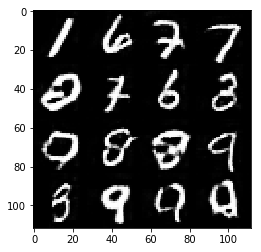

Epoch 2/2... Discriminator Loss: 1.1594... Generator Loss: 0.7943
Epoch 2/2... Discriminator Loss: 1.9506... Generator Loss: 0.2229
Epoch 2/2... Discriminator Loss: 1.0961... Generator Loss: 0.6338
Epoch 2/2... Discriminator Loss: 1.3579... Generator Loss: 1.6789
Epoch 2/2... Discriminator Loss: 1.0428... Generator Loss: 0.8031
Epoch 2/2... Discriminator Loss: 1.2368... Generator Loss: 0.4981
Epoch 2/2... Discriminator Loss: 1.2401... Generator Loss: 0.8826
Epoch 2/2... Discriminator Loss: 1.2267... Generator Loss: 0.5616
Epoch 2/2... Discriminator Loss: 1.2173... Generator Loss: 0.5510
Epoch 2/2... Discriminator Loss: 1.0562... Generator Loss: 0.7515


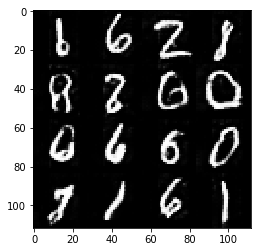

Epoch 2/2... Discriminator Loss: 1.4734... Generator Loss: 0.5321
Epoch 2/2... Discriminator Loss: 0.9039... Generator Loss: 1.0308
Epoch 2/2... Discriminator Loss: 1.5439... Generator Loss: 0.3430
Epoch 2/2... Discriminator Loss: 1.3854... Generator Loss: 0.4254
Epoch 2/2... Discriminator Loss: 1.3924... Generator Loss: 0.4290
Epoch 2/2... Discriminator Loss: 1.1475... Generator Loss: 0.6578
Epoch 2/2... Discriminator Loss: 1.2344... Generator Loss: 0.5157
Epoch 2/2... Discriminator Loss: 1.2726... Generator Loss: 0.5334
Epoch 2/2... Discriminator Loss: 1.1993... Generator Loss: 0.7080
Epoch 2/2... Discriminator Loss: 1.1262... Generator Loss: 1.4588


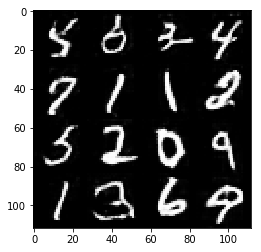

Epoch 2/2... Discriminator Loss: 1.0519... Generator Loss: 0.7859
Epoch 2/2... Discriminator Loss: 1.0856... Generator Loss: 0.7053
Epoch 2/2... Discriminator Loss: 1.1015... Generator Loss: 0.8562
Epoch 2/2... Discriminator Loss: 1.1199... Generator Loss: 0.6938
Epoch 2/2... Discriminator Loss: 1.2113... Generator Loss: 0.5598
Epoch 2/2... Discriminator Loss: 1.0383... Generator Loss: 0.6938
Epoch 2/2... Discriminator Loss: 0.9766... Generator Loss: 0.7660
Epoch 2/2... Discriminator Loss: 1.2611... Generator Loss: 0.5212
Epoch 2/2... Discriminator Loss: 1.3287... Generator Loss: 0.4793
Epoch 2/2... Discriminator Loss: 1.3319... Generator Loss: 0.4758


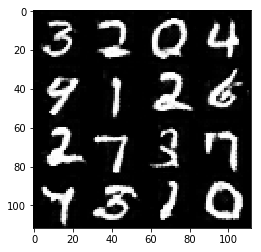

Epoch 2/2... Discriminator Loss: 1.2429... Generator Loss: 0.5618
Epoch 2/2... Discriminator Loss: 1.1184... Generator Loss: 0.7734
Epoch 2/2... Discriminator Loss: 0.9338... Generator Loss: 0.8757
Epoch 2/2... Discriminator Loss: 1.0304... Generator Loss: 0.7780
Epoch 2/2... Discriminator Loss: 1.0428... Generator Loss: 0.7730
Epoch 2/2... Discriminator Loss: 1.5437... Generator Loss: 0.3360
Epoch 2/2... Discriminator Loss: 1.0707... Generator Loss: 0.6851
Epoch 2/2... Discriminator Loss: 1.0792... Generator Loss: 0.8231
Epoch 2/2... Discriminator Loss: 1.2961... Generator Loss: 0.8866
Epoch 2/2... Discriminator Loss: 1.1483... Generator Loss: 0.6836


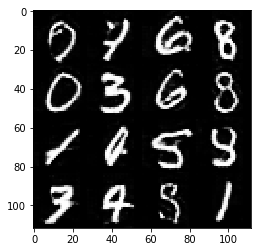

Epoch 2/2... Discriminator Loss: 1.1399... Generator Loss: 1.0141
Epoch 2/2... Discriminator Loss: 1.0066... Generator Loss: 0.6613
Epoch 2/2... Discriminator Loss: 0.9528... Generator Loss: 0.7939
Epoch 2/2... Discriminator Loss: 0.9085... Generator Loss: 1.0730
Epoch 2/2... Discriminator Loss: 0.9681... Generator Loss: 1.1374
Epoch 2/2... Discriminator Loss: 1.3621... Generator Loss: 0.9900
Epoch 2/2... Discriminator Loss: 1.1152... Generator Loss: 1.3539


In [23]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.5

#batch_size = 64
#z_dim = 100
#learning_rate = 0.0001
#beta1 = 0.5

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 0.2025... Generator Loss: 18.5638
Epoch 1/1... Discriminator Loss: 0.1963... Generator Loss: 11.5162
Epoch 1/1... Discriminator Loss: 0.8910... Generator Loss: 4.9597
Epoch 1/1... Discriminator Loss: 0.3679... Generator Loss: 2.1064
Epoch 1/1... Discriminator Loss: 2.5890... Generator Loss: 0.1257
Epoch 1/1... Discriminator Loss: 2.9982... Generator Loss: 0.1420
Epoch 1/1... Discriminator Loss: 1.0580... Generator Loss: 1.1678
Epoch 1/1... Discriminator Loss: 1.5647... Generator Loss: 0.3573
Epoch 1/1... Discriminator Loss: 0.9561... Generator Loss: 1.9903
Epoch 1/1... Discriminator Loss: 1.1768... Generator Loss: 0.8317


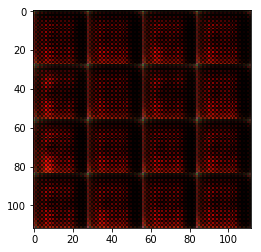

Epoch 1/1... Discriminator Loss: 2.2649... Generator Loss: 0.1477
Epoch 1/1... Discriminator Loss: 1.0677... Generator Loss: 1.4018
Epoch 1/1... Discriminator Loss: 1.1773... Generator Loss: 0.8746
Epoch 1/1... Discriminator Loss: 1.0915... Generator Loss: 0.8932
Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.4031
Epoch 1/1... Discriminator Loss: 0.9624... Generator Loss: 0.8585
Epoch 1/1... Discriminator Loss: 0.7623... Generator Loss: 1.5759
Epoch 1/1... Discriminator Loss: 1.0325... Generator Loss: 0.9572
Epoch 1/1... Discriminator Loss: 1.2334... Generator Loss: 0.5633
Epoch 1/1... Discriminator Loss: 0.9470... Generator Loss: 1.1696


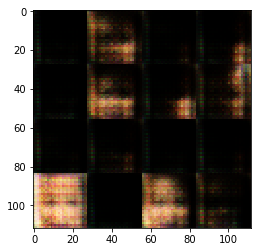

Epoch 1/1... Discriminator Loss: 1.5047... Generator Loss: 0.7067
Epoch 1/1... Discriminator Loss: 1.1229... Generator Loss: 0.6605
Epoch 1/1... Discriminator Loss: 1.0800... Generator Loss: 2.0320
Epoch 1/1... Discriminator Loss: 1.2116... Generator Loss: 1.0556
Epoch 1/1... Discriminator Loss: 1.2831... Generator Loss: 0.7211
Epoch 1/1... Discriminator Loss: 1.6801... Generator Loss: 0.3111
Epoch 1/1... Discriminator Loss: 1.1856... Generator Loss: 0.6392
Epoch 1/1... Discriminator Loss: 1.1152... Generator Loss: 1.4368
Epoch 1/1... Discriminator Loss: 1.2121... Generator Loss: 0.6184
Epoch 1/1... Discriminator Loss: 1.2473... Generator Loss: 1.6147


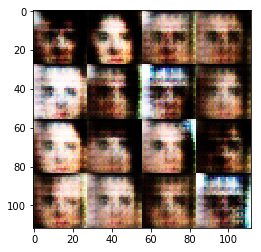

Epoch 1/1... Discriminator Loss: 2.0769... Generator Loss: 0.1737
Epoch 1/1... Discriminator Loss: 1.2607... Generator Loss: 1.2940
Epoch 1/1... Discriminator Loss: 0.9130... Generator Loss: 1.2504
Epoch 1/1... Discriminator Loss: 1.1028... Generator Loss: 1.3644
Epoch 1/1... Discriminator Loss: 1.0795... Generator Loss: 1.2880
Epoch 1/1... Discriminator Loss: 2.3867... Generator Loss: 3.0087
Epoch 1/1... Discriminator Loss: 0.8450... Generator Loss: 1.4539
Epoch 1/1... Discriminator Loss: 1.1322... Generator Loss: 1.5045
Epoch 1/1... Discriminator Loss: 0.9935... Generator Loss: 1.0261
Epoch 1/1... Discriminator Loss: 1.1044... Generator Loss: 2.1284


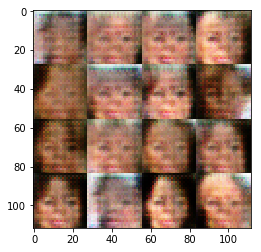

Epoch 1/1... Discriminator Loss: 0.9335... Generator Loss: 0.9321
Epoch 1/1... Discriminator Loss: 1.6110... Generator Loss: 0.2763
Epoch 1/1... Discriminator Loss: 1.3961... Generator Loss: 1.1323
Epoch 1/1... Discriminator Loss: 1.1540... Generator Loss: 0.7508
Epoch 1/1... Discriminator Loss: 1.2582... Generator Loss: 1.3200
Epoch 1/1... Discriminator Loss: 1.0257... Generator Loss: 1.2821
Epoch 1/1... Discriminator Loss: 1.0539... Generator Loss: 0.7530
Epoch 1/1... Discriminator Loss: 1.5241... Generator Loss: 0.4196
Epoch 1/1... Discriminator Loss: 1.1892... Generator Loss: 0.6996
Epoch 1/1... Discriminator Loss: 1.1439... Generator Loss: 1.4134


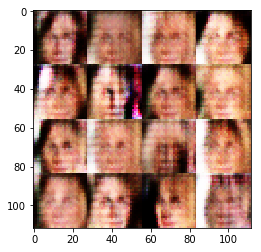

Epoch 1/1... Discriminator Loss: 1.4204... Generator Loss: 1.2102
Epoch 1/1... Discriminator Loss: 1.6547... Generator Loss: 0.3934
Epoch 1/1... Discriminator Loss: 1.1639... Generator Loss: 0.7176
Epoch 1/1... Discriminator Loss: 1.2002... Generator Loss: 0.6058
Epoch 1/1... Discriminator Loss: 1.6159... Generator Loss: 2.2616
Epoch 1/1... Discriminator Loss: 1.7768... Generator Loss: 0.3000
Epoch 1/1... Discriminator Loss: 1.0541... Generator Loss: 1.3349
Epoch 1/1... Discriminator Loss: 1.2560... Generator Loss: 0.6146
Epoch 1/1... Discriminator Loss: 1.3388... Generator Loss: 0.4346
Epoch 1/1... Discriminator Loss: 1.3191... Generator Loss: 1.0298


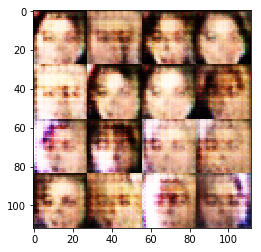

Epoch 1/1... Discriminator Loss: 1.3772... Generator Loss: 0.8094
Epoch 1/1... Discriminator Loss: 1.5482... Generator Loss: 0.4370
Epoch 1/1... Discriminator Loss: 1.0649... Generator Loss: 1.1290
Epoch 1/1... Discriminator Loss: 1.0842... Generator Loss: 1.1854
Epoch 1/1... Discriminator Loss: 1.1092... Generator Loss: 1.3208
Epoch 1/1... Discriminator Loss: 1.2417... Generator Loss: 1.4168
Epoch 1/1... Discriminator Loss: 1.1312... Generator Loss: 1.0176
Epoch 1/1... Discriminator Loss: 1.7114... Generator Loss: 0.3554
Epoch 1/1... Discriminator Loss: 1.0689... Generator Loss: 1.1361
Epoch 1/1... Discriminator Loss: 1.0097... Generator Loss: 1.1178


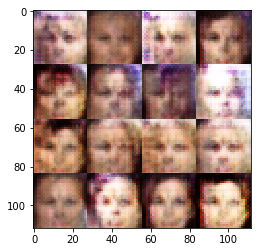

Epoch 1/1... Discriminator Loss: 1.6360... Generator Loss: 0.5843
Epoch 1/1... Discriminator Loss: 1.3074... Generator Loss: 0.7172
Epoch 1/1... Discriminator Loss: 1.0882... Generator Loss: 0.7491
Epoch 1/1... Discriminator Loss: 2.0395... Generator Loss: 2.5509
Epoch 1/1... Discriminator Loss: 1.2253... Generator Loss: 1.1118
Epoch 1/1... Discriminator Loss: 0.9347... Generator Loss: 1.2278
Epoch 1/1... Discriminator Loss: 1.1075... Generator Loss: 1.1257
Epoch 1/1... Discriminator Loss: 1.4703... Generator Loss: 0.4928
Epoch 1/1... Discriminator Loss: 1.5423... Generator Loss: 0.5068
Epoch 1/1... Discriminator Loss: 1.2146... Generator Loss: 0.8757


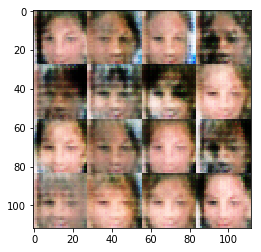

Epoch 1/1... Discriminator Loss: 1.2580... Generator Loss: 0.6086
Epoch 1/1... Discriminator Loss: 1.0903... Generator Loss: 1.2349
Epoch 1/1... Discriminator Loss: 1.2021... Generator Loss: 1.2746
Epoch 1/1... Discriminator Loss: 1.0984... Generator Loss: 1.0698
Epoch 1/1... Discriminator Loss: 1.5606... Generator Loss: 0.4133
Epoch 1/1... Discriminator Loss: 1.4353... Generator Loss: 1.1268
Epoch 1/1... Discriminator Loss: 1.0019... Generator Loss: 0.7281
Epoch 1/1... Discriminator Loss: 1.1295... Generator Loss: 0.6414
Epoch 1/1... Discriminator Loss: 1.0288... Generator Loss: 1.2124
Epoch 1/1... Discriminator Loss: 1.2682... Generator Loss: 0.5124


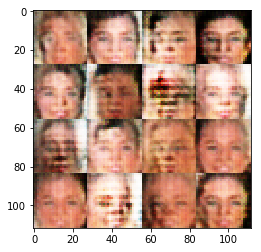

Epoch 1/1... Discriminator Loss: 1.7466... Generator Loss: 2.6307
Epoch 1/1... Discriminator Loss: 0.9134... Generator Loss: 1.3213
Epoch 1/1... Discriminator Loss: 1.2723... Generator Loss: 1.7376
Epoch 1/1... Discriminator Loss: 1.2979... Generator Loss: 0.7288
Epoch 1/1... Discriminator Loss: 1.2105... Generator Loss: 0.6820
Epoch 1/1... Discriminator Loss: 1.1450... Generator Loss: 1.2279
Epoch 1/1... Discriminator Loss: 0.8316... Generator Loss: 1.0171
Epoch 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.5473
Epoch 1/1... Discriminator Loss: 1.1990... Generator Loss: 0.7449
Epoch 1/1... Discriminator Loss: 1.1815... Generator Loss: 0.5980


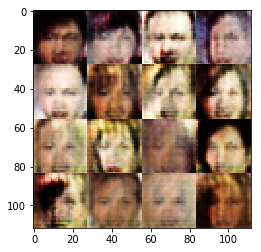

Epoch 1/1... Discriminator Loss: 1.2588... Generator Loss: 0.8725
Epoch 1/1... Discriminator Loss: 1.1842... Generator Loss: 0.7837
Epoch 1/1... Discriminator Loss: 1.4080... Generator Loss: 0.5325
Epoch 1/1... Discriminator Loss: 1.0327... Generator Loss: 1.1470
Epoch 1/1... Discriminator Loss: 1.2444... Generator Loss: 1.4859
Epoch 1/1... Discriminator Loss: 1.5405... Generator Loss: 0.3804
Epoch 1/1... Discriminator Loss: 1.2203... Generator Loss: 0.8655
Epoch 1/1... Discriminator Loss: 1.0933... Generator Loss: 0.7434
Epoch 1/1... Discriminator Loss: 1.2134... Generator Loss: 1.0015
Epoch 1/1... Discriminator Loss: 1.1513... Generator Loss: 0.7242


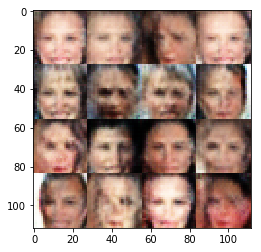

Epoch 1/1... Discriminator Loss: 1.3272... Generator Loss: 0.4050
Epoch 1/1... Discriminator Loss: 1.3618... Generator Loss: 0.9382
Epoch 1/1... Discriminator Loss: 1.3024... Generator Loss: 0.4948
Epoch 1/1... Discriminator Loss: 1.2044... Generator Loss: 1.4129
Epoch 1/1... Discriminator Loss: 1.2725... Generator Loss: 0.5585
Epoch 1/1... Discriminator Loss: 1.2238... Generator Loss: 0.6638
Epoch 1/1... Discriminator Loss: 1.4677... Generator Loss: 0.4525
Epoch 1/1... Discriminator Loss: 1.2758... Generator Loss: 1.0235
Epoch 1/1... Discriminator Loss: 1.5418... Generator Loss: 0.4501
Epoch 1/1... Discriminator Loss: 1.2273... Generator Loss: 0.8777


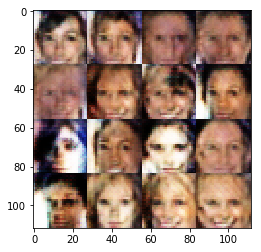

Epoch 1/1... Discriminator Loss: 1.2416... Generator Loss: 0.6950
Epoch 1/1... Discriminator Loss: 1.5359... Generator Loss: 1.4694
Epoch 1/1... Discriminator Loss: 1.1954... Generator Loss: 0.6616
Epoch 1/1... Discriminator Loss: 1.4832... Generator Loss: 0.4880
Epoch 1/1... Discriminator Loss: 1.2525... Generator Loss: 0.6233
Epoch 1/1... Discriminator Loss: 1.1107... Generator Loss: 1.3105
Epoch 1/1... Discriminator Loss: 1.3418... Generator Loss: 1.0360
Epoch 1/1... Discriminator Loss: 1.2608... Generator Loss: 0.7860
Epoch 1/1... Discriminator Loss: 1.4291... Generator Loss: 0.4662
Epoch 1/1... Discriminator Loss: 1.1049... Generator Loss: 0.9719


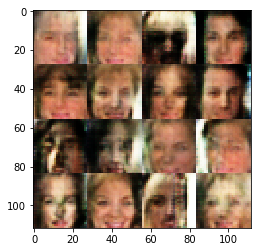

Epoch 1/1... Discriminator Loss: 1.1903... Generator Loss: 0.6232
Epoch 1/1... Discriminator Loss: 1.2511... Generator Loss: 0.5694
Epoch 1/1... Discriminator Loss: 1.2280... Generator Loss: 0.6941
Epoch 1/1... Discriminator Loss: 1.1430... Generator Loss: 0.8567
Epoch 1/1... Discriminator Loss: 1.6489... Generator Loss: 0.3245
Epoch 1/1... Discriminator Loss: 1.3286... Generator Loss: 0.7558
Epoch 1/1... Discriminator Loss: 1.2711... Generator Loss: 0.5998
Epoch 1/1... Discriminator Loss: 1.3544... Generator Loss: 0.5726
Epoch 1/1... Discriminator Loss: 1.1673... Generator Loss: 0.9042
Epoch 1/1... Discriminator Loss: 1.0959... Generator Loss: 1.3465


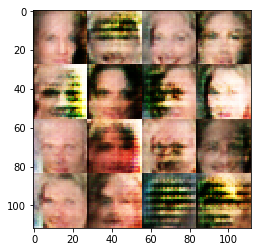

Epoch 1/1... Discriminator Loss: 1.3264... Generator Loss: 0.5990
Epoch 1/1... Discriminator Loss: 1.3127... Generator Loss: 1.1375
Epoch 1/1... Discriminator Loss: 1.3904... Generator Loss: 0.5090
Epoch 1/1... Discriminator Loss: 1.4405... Generator Loss: 0.4969
Epoch 1/1... Discriminator Loss: 1.2031... Generator Loss: 0.6699
Epoch 1/1... Discriminator Loss: 1.1484... Generator Loss: 0.9191
Epoch 1/1... Discriminator Loss: 1.3240... Generator Loss: 0.8531
Epoch 1/1... Discriminator Loss: 1.2500... Generator Loss: 0.6026
Epoch 1/1... Discriminator Loss: 1.4767... Generator Loss: 0.4550
Epoch 1/1... Discriminator Loss: 1.1502... Generator Loss: 0.9034


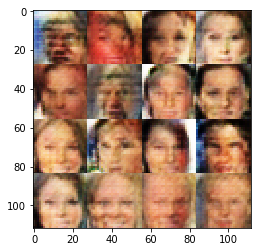

Epoch 1/1... Discriminator Loss: 1.6749... Generator Loss: 0.3105
Epoch 1/1... Discriminator Loss: 1.3381... Generator Loss: 0.5534
Epoch 1/1... Discriminator Loss: 1.1552... Generator Loss: 0.6770
Epoch 1/1... Discriminator Loss: 1.1533... Generator Loss: 1.1761
Epoch 1/1... Discriminator Loss: 1.3186... Generator Loss: 0.9840
Epoch 1/1... Discriminator Loss: 1.3425... Generator Loss: 0.5984
Epoch 1/1... Discriminator Loss: 1.1964... Generator Loss: 0.8910
Epoch 1/1... Discriminator Loss: 1.3041... Generator Loss: 0.6126
Epoch 1/1... Discriminator Loss: 1.2845... Generator Loss: 1.2064
Epoch 1/1... Discriminator Loss: 1.4280... Generator Loss: 0.4940


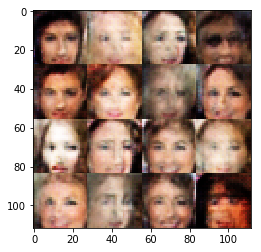

Epoch 1/1... Discriminator Loss: 1.5001... Generator Loss: 0.4002
Epoch 1/1... Discriminator Loss: 1.2505... Generator Loss: 0.7712
Epoch 1/1... Discriminator Loss: 1.1472... Generator Loss: 0.7977
Epoch 1/1... Discriminator Loss: 1.3910... Generator Loss: 0.9630
Epoch 1/1... Discriminator Loss: 1.2531... Generator Loss: 0.7957
Epoch 1/1... Discriminator Loss: 1.5035... Generator Loss: 0.4415
Epoch 1/1... Discriminator Loss: 1.3054... Generator Loss: 0.9506
Epoch 1/1... Discriminator Loss: 1.3612... Generator Loss: 0.4963
Epoch 1/1... Discriminator Loss: 1.2061... Generator Loss: 0.7925
Epoch 1/1... Discriminator Loss: 1.1503... Generator Loss: 0.9079


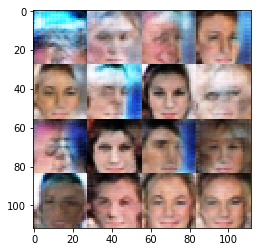

Epoch 1/1... Discriminator Loss: 1.2718... Generator Loss: 0.7693
Epoch 1/1... Discriminator Loss: 1.3490... Generator Loss: 0.5364
Epoch 1/1... Discriminator Loss: 1.1253... Generator Loss: 0.7809
Epoch 1/1... Discriminator Loss: 1.2544... Generator Loss: 0.7515
Epoch 1/1... Discriminator Loss: 1.3356... Generator Loss: 0.5477
Epoch 1/1... Discriminator Loss: 1.3314... Generator Loss: 0.5331
Epoch 1/1... Discriminator Loss: 1.0516... Generator Loss: 0.8362
Epoch 1/1... Discriminator Loss: 1.1484... Generator Loss: 0.7936
Epoch 1/1... Discriminator Loss: 1.5060... Generator Loss: 0.3544
Epoch 1/1... Discriminator Loss: 1.3685... Generator Loss: 0.7670


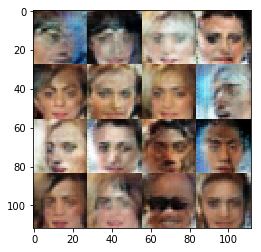

Epoch 1/1... Discriminator Loss: 1.3470... Generator Loss: 1.0340
Epoch 1/1... Discriminator Loss: 1.2701... Generator Loss: 0.5061
Epoch 1/1... Discriminator Loss: 1.4980... Generator Loss: 0.4804
Epoch 1/1... Discriminator Loss: 1.2198... Generator Loss: 0.9381
Epoch 1/1... Discriminator Loss: 1.3202... Generator Loss: 0.8330
Epoch 1/1... Discriminator Loss: 1.2645... Generator Loss: 1.0572
Epoch 1/1... Discriminator Loss: 1.3629... Generator Loss: 0.7794
Epoch 1/1... Discriminator Loss: 1.3268... Generator Loss: 0.4851
Epoch 1/1... Discriminator Loss: 1.5857... Generator Loss: 0.4106
Epoch 1/1... Discriminator Loss: 1.1097... Generator Loss: 0.8976


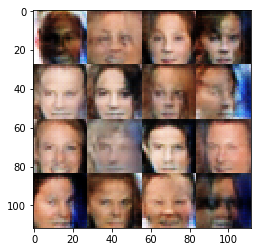

Epoch 1/1... Discriminator Loss: 1.5524... Generator Loss: 0.3678
Epoch 1/1... Discriminator Loss: 1.5477... Generator Loss: 0.3840
Epoch 1/1... Discriminator Loss: 1.2639... Generator Loss: 1.1342
Epoch 1/1... Discriminator Loss: 1.2693... Generator Loss: 0.8974
Epoch 1/1... Discriminator Loss: 1.2279... Generator Loss: 0.7906
Epoch 1/1... Discriminator Loss: 1.2436... Generator Loss: 0.6377
Epoch 1/1... Discriminator Loss: 1.2265... Generator Loss: 0.5852
Epoch 1/1... Discriminator Loss: 1.2652... Generator Loss: 0.7418
Epoch 1/1... Discriminator Loss: 1.3046... Generator Loss: 0.8520
Epoch 1/1... Discriminator Loss: 1.5245... Generator Loss: 0.4016


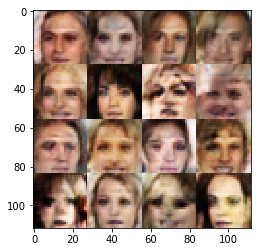

Epoch 1/1... Discriminator Loss: 1.3255... Generator Loss: 0.8024
Epoch 1/1... Discriminator Loss: 1.4231... Generator Loss: 0.4606
Epoch 1/1... Discriminator Loss: 1.2786... Generator Loss: 1.2997
Epoch 1/1... Discriminator Loss: 1.4699... Generator Loss: 0.4405
Epoch 1/1... Discriminator Loss: 1.2584... Generator Loss: 0.8093
Epoch 1/1... Discriminator Loss: 1.3070... Generator Loss: 0.4984
Epoch 1/1... Discriminator Loss: 1.2892... Generator Loss: 0.5968
Epoch 1/1... Discriminator Loss: 1.3931... Generator Loss: 0.4953
Epoch 1/1... Discriminator Loss: 1.2969... Generator Loss: 0.7285
Epoch 1/1... Discriminator Loss: 1.3862... Generator Loss: 0.5492


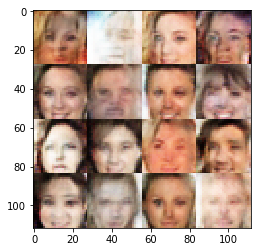

Epoch 1/1... Discriminator Loss: 1.2855... Generator Loss: 1.2429
Epoch 1/1... Discriminator Loss: 1.2208... Generator Loss: 0.6805
Epoch 1/1... Discriminator Loss: 1.3206... Generator Loss: 1.0872
Epoch 1/1... Discriminator Loss: 1.3280... Generator Loss: 1.1288
Epoch 1/1... Discriminator Loss: 1.2394... Generator Loss: 0.7580
Epoch 1/1... Discriminator Loss: 1.5205... Generator Loss: 0.4118
Epoch 1/1... Discriminator Loss: 1.4832... Generator Loss: 0.6241
Epoch 1/1... Discriminator Loss: 1.3535... Generator Loss: 0.4918
Epoch 1/1... Discriminator Loss: 1.2479... Generator Loss: 0.5287
Epoch 1/1... Discriminator Loss: 1.2270... Generator Loss: 0.9944


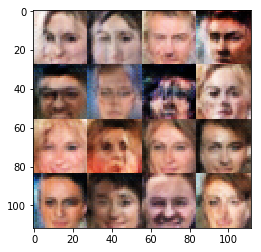

Epoch 1/1... Discriminator Loss: 1.3721... Generator Loss: 0.5574
Epoch 1/1... Discriminator Loss: 1.2310... Generator Loss: 1.1691
Epoch 1/1... Discriminator Loss: 1.4706... Generator Loss: 0.3915
Epoch 1/1... Discriminator Loss: 1.3427... Generator Loss: 0.8444
Epoch 1/1... Discriminator Loss: 1.3630... Generator Loss: 0.8011
Epoch 1/1... Discriminator Loss: 1.3765... Generator Loss: 0.5800
Epoch 1/1... Discriminator Loss: 1.1801... Generator Loss: 0.7600
Epoch 1/1... Discriminator Loss: 1.3581... Generator Loss: 0.6417
Epoch 1/1... Discriminator Loss: 1.3654... Generator Loss: 0.4915
Epoch 1/1... Discriminator Loss: 1.3786... Generator Loss: 0.5255


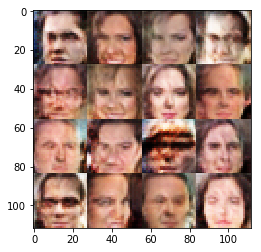

Epoch 1/1... Discriminator Loss: 1.3597... Generator Loss: 0.8271
Epoch 1/1... Discriminator Loss: 1.2177... Generator Loss: 0.8158
Epoch 1/1... Discriminator Loss: 1.2283... Generator Loss: 1.0464
Epoch 1/1... Discriminator Loss: 1.1968... Generator Loss: 0.7969
Epoch 1/1... Discriminator Loss: 1.4363... Generator Loss: 0.4438
Epoch 1/1... Discriminator Loss: 1.2513... Generator Loss: 0.6276
Epoch 1/1... Discriminator Loss: 1.4619... Generator Loss: 0.5585
Epoch 1/1... Discriminator Loss: 1.3124... Generator Loss: 0.5454
Epoch 1/1... Discriminator Loss: 1.3231... Generator Loss: 0.6989
Epoch 1/1... Discriminator Loss: 1.3437... Generator Loss: 0.7829


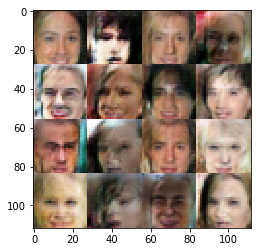

Epoch 1/1... Discriminator Loss: 1.5782... Generator Loss: 0.3467
Epoch 1/1... Discriminator Loss: 1.4037... Generator Loss: 0.5162
Epoch 1/1... Discriminator Loss: 1.3672... Generator Loss: 0.9543
Epoch 1/1... Discriminator Loss: 1.6901... Generator Loss: 0.2940
Epoch 1/1... Discriminator Loss: 1.2149... Generator Loss: 0.7199
Epoch 1/1... Discriminator Loss: 1.4208... Generator Loss: 0.4791
Epoch 1/1... Discriminator Loss: 1.1190... Generator Loss: 0.7273
Epoch 1/1... Discriminator Loss: 1.2854... Generator Loss: 0.7504
Epoch 1/1... Discriminator Loss: 1.4237... Generator Loss: 0.4306
Epoch 1/1... Discriminator Loss: 1.4807... Generator Loss: 0.5080


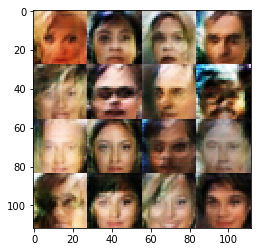

Epoch 1/1... Discriminator Loss: 1.3444... Generator Loss: 0.5717
Epoch 1/1... Discriminator Loss: 1.4071... Generator Loss: 0.5660
Epoch 1/1... Discriminator Loss: 1.2504... Generator Loss: 0.7427
Epoch 1/1... Discriminator Loss: 1.2480... Generator Loss: 0.8485
Epoch 1/1... Discriminator Loss: 1.2490... Generator Loss: 0.9658
Epoch 1/1... Discriminator Loss: 1.5150... Generator Loss: 0.4136
Epoch 1/1... Discriminator Loss: 1.3839... Generator Loss: 0.8748
Epoch 1/1... Discriminator Loss: 1.3118... Generator Loss: 0.7296
Epoch 1/1... Discriminator Loss: 1.3785... Generator Loss: 0.4879
Epoch 1/1... Discriminator Loss: 1.2865... Generator Loss: 0.5099


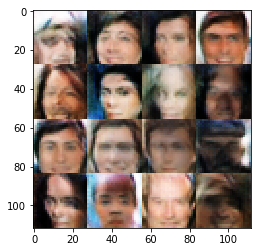

Epoch 1/1... Discriminator Loss: 1.2868... Generator Loss: 0.5982
Epoch 1/1... Discriminator Loss: 1.1847... Generator Loss: 0.6703
Epoch 1/1... Discriminator Loss: 1.3360... Generator Loss: 0.5754
Epoch 1/1... Discriminator Loss: 1.2660... Generator Loss: 0.7605
Epoch 1/1... Discriminator Loss: 1.3272... Generator Loss: 1.1951
Epoch 1/1... Discriminator Loss: 1.5586... Generator Loss: 0.3500
Epoch 1/1... Discriminator Loss: 1.5132... Generator Loss: 0.4576
Epoch 1/1... Discriminator Loss: 1.4235... Generator Loss: 0.6437
Epoch 1/1... Discriminator Loss: 1.4091... Generator Loss: 0.7844
Epoch 1/1... Discriminator Loss: 1.3287... Generator Loss: 0.7408


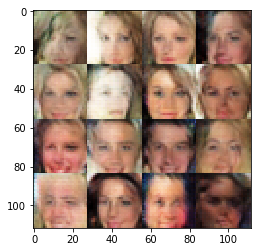

Epoch 1/1... Discriminator Loss: 1.3018... Generator Loss: 1.1226
Epoch 1/1... Discriminator Loss: 1.4335... Generator Loss: 0.5742
Epoch 1/1... Discriminator Loss: 1.3791... Generator Loss: 0.7519
Epoch 1/1... Discriminator Loss: 1.5330... Generator Loss: 0.3831
Epoch 1/1... Discriminator Loss: 1.4497... Generator Loss: 0.4461
Epoch 1/1... Discriminator Loss: 1.3595... Generator Loss: 0.5218
Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.4688
Epoch 1/1... Discriminator Loss: 1.1975... Generator Loss: 0.7286
Epoch 1/1... Discriminator Loss: 1.5000... Generator Loss: 0.6631
Epoch 1/1... Discriminator Loss: 1.3521... Generator Loss: 0.8928


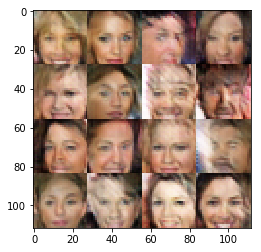

Epoch 1/1... Discriminator Loss: 1.3121... Generator Loss: 0.6844
Epoch 1/1... Discriminator Loss: 1.4246... Generator Loss: 0.5835
Epoch 1/1... Discriminator Loss: 1.6048... Generator Loss: 0.3441
Epoch 1/1... Discriminator Loss: 1.2564... Generator Loss: 0.7995
Epoch 1/1... Discriminator Loss: 1.6758... Generator Loss: 0.3066
Epoch 1/1... Discriminator Loss: 1.3752... Generator Loss: 0.5989
Epoch 1/1... Discriminator Loss: 1.3654... Generator Loss: 0.4688
Epoch 1/1... Discriminator Loss: 1.4576... Generator Loss: 0.4214
Epoch 1/1... Discriminator Loss: 1.5677... Generator Loss: 0.3360
Epoch 1/1... Discriminator Loss: 1.3845... Generator Loss: 0.5218


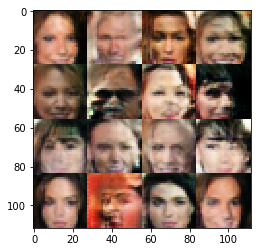

Epoch 1/1... Discriminator Loss: 1.3050... Generator Loss: 0.5489
Epoch 1/1... Discriminator Loss: 1.4304... Generator Loss: 1.0175
Epoch 1/1... Discriminator Loss: 1.3694... Generator Loss: 0.4814
Epoch 1/1... Discriminator Loss: 1.6221... Generator Loss: 0.8670
Epoch 1/1... Discriminator Loss: 1.5064... Generator Loss: 0.4128
Epoch 1/1... Discriminator Loss: 1.2792... Generator Loss: 0.6826
Epoch 1/1... Discriminator Loss: 1.2812... Generator Loss: 0.5138
Epoch 1/1... Discriminator Loss: 1.4610... Generator Loss: 1.4565
Epoch 1/1... Discriminator Loss: 1.3422... Generator Loss: 0.5966
Epoch 1/1... Discriminator Loss: 1.3221... Generator Loss: 0.5771


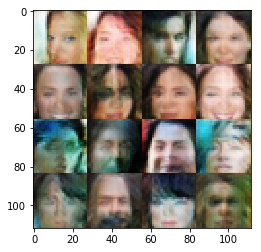

Epoch 1/1... Discriminator Loss: 1.4036... Generator Loss: 0.6738
Epoch 1/1... Discriminator Loss: 1.3079... Generator Loss: 0.6806
Epoch 1/1... Discriminator Loss: 1.4348... Generator Loss: 0.4420
Epoch 1/1... Discriminator Loss: 1.2084... Generator Loss: 0.7516
Epoch 1/1... Discriminator Loss: 1.4367... Generator Loss: 0.5096
Epoch 1/1... Discriminator Loss: 1.4000... Generator Loss: 0.5731
Epoch 1/1... Discriminator Loss: 1.2558... Generator Loss: 0.6685
Epoch 1/1... Discriminator Loss: 1.2537... Generator Loss: 0.8548
Epoch 1/1... Discriminator Loss: 1.6227... Generator Loss: 0.4043
Epoch 1/1... Discriminator Loss: 1.4233... Generator Loss: 0.5219


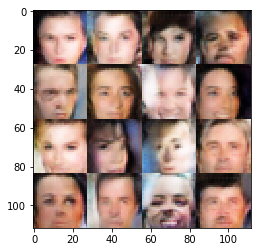

Epoch 1/1... Discriminator Loss: 1.2721... Generator Loss: 0.6958
Epoch 1/1... Discriminator Loss: 1.2719... Generator Loss: 0.8323
Epoch 1/1... Discriminator Loss: 1.4497... Generator Loss: 0.4526
Epoch 1/1... Discriminator Loss: 1.3221... Generator Loss: 0.7413
Epoch 1/1... Discriminator Loss: 1.2846... Generator Loss: 1.1091
Epoch 1/1... Discriminator Loss: 1.4084... Generator Loss: 0.4919


In [17]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.

### Lots of epochs

Epoch 1/5... Discriminator Loss: 0.6293... Generator Loss: 1.1751
Epoch 1/5... Discriminator Loss: 0.3679... Generator Loss: 2.5745
Epoch 1/5... Discriminator Loss: 0.4497... Generator Loss: 1.7113
Epoch 1/5... Discriminator Loss: 1.1229... Generator Loss: 1.8193
Epoch 1/5... Discriminator Loss: 1.1486... Generator Loss: 1.0349


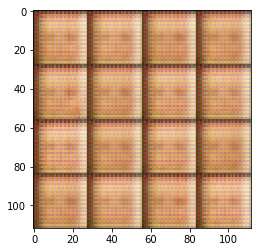

Epoch 1/5... Discriminator Loss: 0.6970... Generator Loss: 1.5151
Epoch 1/5... Discriminator Loss: 1.1051... Generator Loss: 1.3348
Epoch 1/5... Discriminator Loss: 1.3515... Generator Loss: 0.6926
Epoch 1/5... Discriminator Loss: 1.1229... Generator Loss: 0.9890
Epoch 1/5... Discriminator Loss: 1.4574... Generator Loss: 0.6440


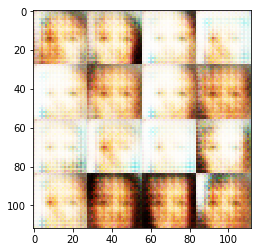

Epoch 1/5... Discriminator Loss: 1.1830... Generator Loss: 0.7006
Epoch 1/5... Discriminator Loss: 1.2643... Generator Loss: 0.7180
Epoch 1/5... Discriminator Loss: 1.0274... Generator Loss: 0.9937
Epoch 1/5... Discriminator Loss: 1.1441... Generator Loss: 0.7917
Epoch 1/5... Discriminator Loss: 1.4085... Generator Loss: 1.2080


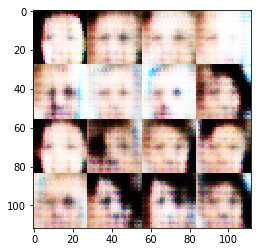

Epoch 1/5... Discriminator Loss: 1.3696... Generator Loss: 0.7148
Epoch 1/5... Discriminator Loss: 1.4158... Generator Loss: 1.3947
Epoch 1/5... Discriminator Loss: 1.1281... Generator Loss: 0.7064
Epoch 1/5... Discriminator Loss: 1.5992... Generator Loss: 1.6310
Epoch 1/5... Discriminator Loss: 1.8238... Generator Loss: 2.6103


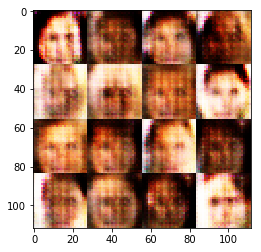

Epoch 1/5... Discriminator Loss: 1.2987... Generator Loss: 0.5131
Epoch 1/5... Discriminator Loss: 1.1481... Generator Loss: 0.9446
Epoch 1/5... Discriminator Loss: 1.6914... Generator Loss: 1.9201
Epoch 1/5... Discriminator Loss: 1.3754... Generator Loss: 0.4193
Epoch 1/5... Discriminator Loss: 1.2494... Generator Loss: 1.1259


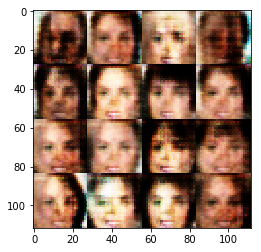

Epoch 1/5... Discriminator Loss: 1.3184... Generator Loss: 0.7981
Epoch 1/5... Discriminator Loss: 1.2089... Generator Loss: 0.8680
Epoch 1/5... Discriminator Loss: 1.2248... Generator Loss: 0.8971
Epoch 1/5... Discriminator Loss: 1.9048... Generator Loss: 0.2662
Epoch 1/5... Discriminator Loss: 2.2814... Generator Loss: 0.1582


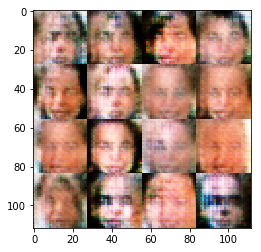

Epoch 1/5... Discriminator Loss: 1.4054... Generator Loss: 0.4543
Epoch 1/5... Discriminator Loss: 1.3776... Generator Loss: 0.5182
Epoch 1/5... Discriminator Loss: 1.3318... Generator Loss: 0.8784
Epoch 1/5... Discriminator Loss: 1.2013... Generator Loss: 0.7267
Epoch 1/5... Discriminator Loss: 1.2429... Generator Loss: 0.7274


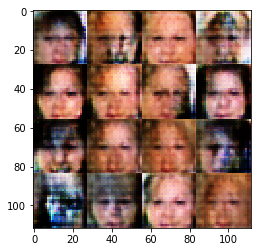

Epoch 1/5... Discriminator Loss: 1.3597... Generator Loss: 0.7387
Epoch 1/5... Discriminator Loss: 1.3768... Generator Loss: 0.6718
Epoch 1/5... Discriminator Loss: 1.5525... Generator Loss: 0.3850
Epoch 1/5... Discriminator Loss: 1.4650... Generator Loss: 0.8775
Epoch 1/5... Discriminator Loss: 1.2079... Generator Loss: 1.4172


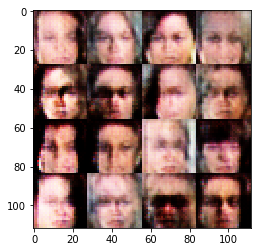

Epoch 1/5... Discriminator Loss: 1.5639... Generator Loss: 0.3661
Epoch 1/5... Discriminator Loss: 1.3981... Generator Loss: 1.2966
Epoch 1/5... Discriminator Loss: 1.2994... Generator Loss: 0.5699
Epoch 1/5... Discriminator Loss: 1.3698... Generator Loss: 1.2412
Epoch 1/5... Discriminator Loss: 1.2031... Generator Loss: 1.0021


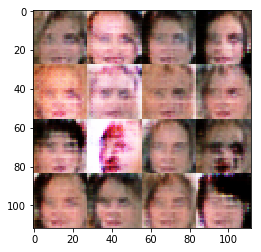

Epoch 1/5... Discriminator Loss: 1.2454... Generator Loss: 0.6456
Epoch 1/5... Discriminator Loss: 1.1032... Generator Loss: 0.7147
Epoch 1/5... Discriminator Loss: 1.1834... Generator Loss: 0.7548
Epoch 1/5... Discriminator Loss: 1.3892... Generator Loss: 1.4802
Epoch 1/5... Discriminator Loss: 1.4545... Generator Loss: 0.3956


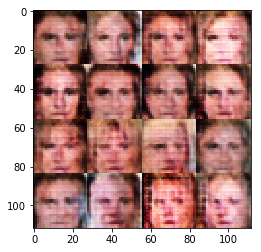

Epoch 1/5... Discriminator Loss: 1.3766... Generator Loss: 0.4710
Epoch 1/5... Discriminator Loss: 1.1009... Generator Loss: 1.0799
Epoch 1/5... Discriminator Loss: 0.9609... Generator Loss: 0.9338
Epoch 1/5... Discriminator Loss: 1.0853... Generator Loss: 0.7234
Epoch 1/5... Discriminator Loss: 1.2451... Generator Loss: 0.9410


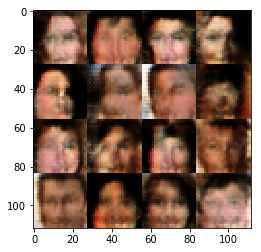

Epoch 1/5... Discriminator Loss: 0.9500... Generator Loss: 1.0530
Epoch 1/5... Discriminator Loss: 1.0622... Generator Loss: 0.7632
Epoch 1/5... Discriminator Loss: 1.1344... Generator Loss: 0.7723
Epoch 1/5... Discriminator Loss: 1.2321... Generator Loss: 1.0949
Epoch 1/5... Discriminator Loss: 1.2717... Generator Loss: 0.7378


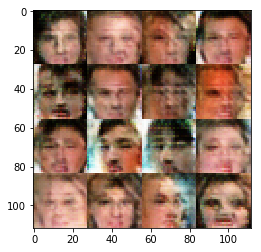

Epoch 1/5... Discriminator Loss: 1.0188... Generator Loss: 1.5841
Epoch 1/5... Discriminator Loss: 1.3794... Generator Loss: 0.4527
Epoch 1/5... Discriminator Loss: 1.2426... Generator Loss: 0.6925
Epoch 1/5... Discriminator Loss: 1.0975... Generator Loss: 0.8152
Epoch 1/5... Discriminator Loss: 1.3153... Generator Loss: 0.8205


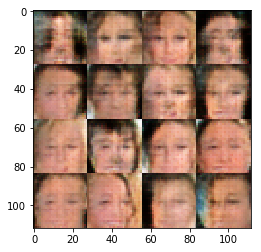

Epoch 1/5... Discriminator Loss: 1.1475... Generator Loss: 0.8233
Epoch 1/5... Discriminator Loss: 1.2777... Generator Loss: 0.5971
Epoch 1/5... Discriminator Loss: 2.1706... Generator Loss: 0.1664
Epoch 1/5... Discriminator Loss: 1.2349... Generator Loss: 0.6440
Epoch 1/5... Discriminator Loss: 1.1837... Generator Loss: 1.0672


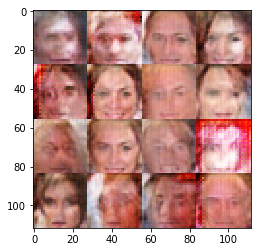

Epoch 1/5... Discriminator Loss: 1.4434... Generator Loss: 0.7570
Epoch 1/5... Discriminator Loss: 1.3285... Generator Loss: 0.6222
Epoch 1/5... Discriminator Loss: 1.2442... Generator Loss: 1.3279
Epoch 1/5... Discriminator Loss: 1.6047... Generator Loss: 0.3102
Epoch 1/5... Discriminator Loss: 1.2790... Generator Loss: 0.4925


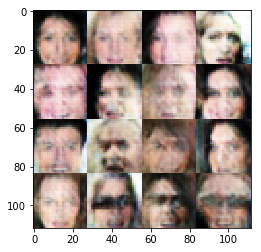

Epoch 1/5... Discriminator Loss: 1.4400... Generator Loss: 1.6524
Epoch 1/5... Discriminator Loss: 1.3821... Generator Loss: 0.6078
Epoch 1/5... Discriminator Loss: 1.3072... Generator Loss: 0.7415
Epoch 1/5... Discriminator Loss: 1.3541... Generator Loss: 0.5309
Epoch 1/5... Discriminator Loss: 1.2908... Generator Loss: 0.5367


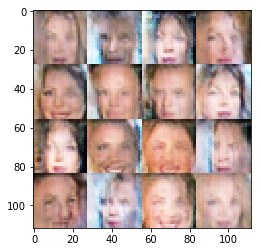

Epoch 1/5... Discriminator Loss: 1.5243... Generator Loss: 1.7798
Epoch 1/5... Discriminator Loss: 1.2993... Generator Loss: 0.6499
Epoch 1/5... Discriminator Loss: 1.4382... Generator Loss: 0.4185
Epoch 1/5... Discriminator Loss: 1.2610... Generator Loss: 0.7719
Epoch 1/5... Discriminator Loss: 1.1361... Generator Loss: 0.8059


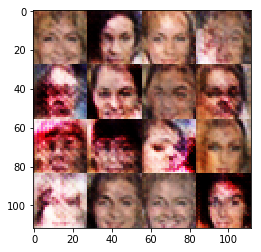

Epoch 1/5... Discriminator Loss: 1.1308... Generator Loss: 1.2006
Epoch 1/5... Discriminator Loss: 1.1607... Generator Loss: 0.6310
Epoch 1/5... Discriminator Loss: 1.3560... Generator Loss: 1.2267
Epoch 1/5... Discriminator Loss: 1.2549... Generator Loss: 0.8704
Epoch 1/5... Discriminator Loss: 1.4094... Generator Loss: 0.5048


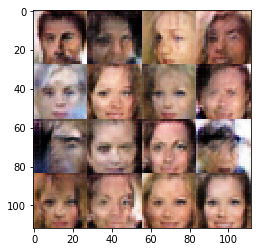

Epoch 1/5... Discriminator Loss: 1.0535... Generator Loss: 0.7643
Epoch 1/5... Discriminator Loss: 1.1508... Generator Loss: 0.9664
Epoch 1/5... Discriminator Loss: 1.3468... Generator Loss: 0.6127
Epoch 1/5... Discriminator Loss: 1.3789... Generator Loss: 0.5135
Epoch 1/5... Discriminator Loss: 1.2317... Generator Loss: 0.8342


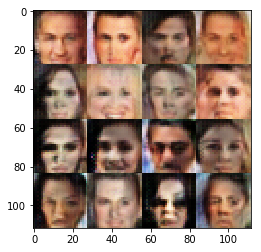

Epoch 1/5... Discriminator Loss: 1.3437... Generator Loss: 0.6305
Epoch 1/5... Discriminator Loss: 1.2031... Generator Loss: 1.1377
Epoch 1/5... Discriminator Loss: 1.4141... Generator Loss: 0.6391
Epoch 1/5... Discriminator Loss: 1.3753... Generator Loss: 0.5557
Epoch 1/5... Discriminator Loss: 1.3360... Generator Loss: 0.7260


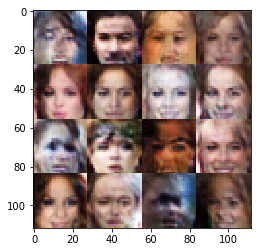

Epoch 1/5... Discriminator Loss: 1.2455... Generator Loss: 0.6964
Epoch 1/5... Discriminator Loss: 1.3463... Generator Loss: 0.7865
Epoch 1/5... Discriminator Loss: 1.4101... Generator Loss: 0.5997
Epoch 1/5... Discriminator Loss: 1.3668... Generator Loss: 0.5680
Epoch 1/5... Discriminator Loss: 1.3903... Generator Loss: 1.1243


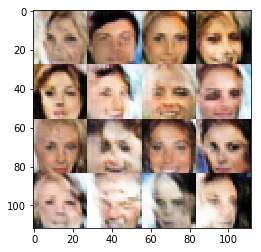

Epoch 1/5... Discriminator Loss: 1.1100... Generator Loss: 0.8454
Epoch 1/5... Discriminator Loss: 1.2207... Generator Loss: 0.8124
Epoch 1/5... Discriminator Loss: 1.2750... Generator Loss: 0.6281
Epoch 1/5... Discriminator Loss: 1.1535... Generator Loss: 0.6096
Epoch 1/5... Discriminator Loss: 1.4203... Generator Loss: 0.5039


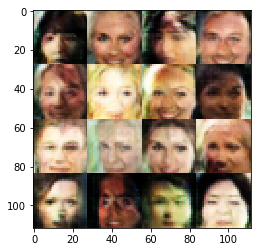

Epoch 1/5... Discriminator Loss: 1.3469... Generator Loss: 0.7079
Epoch 1/5... Discriminator Loss: 1.3534... Generator Loss: 0.7266
Epoch 1/5... Discriminator Loss: 1.4412... Generator Loss: 0.4783
Epoch 1/5... Discriminator Loss: 1.3056... Generator Loss: 0.8209
Epoch 1/5... Discriminator Loss: 1.4770... Generator Loss: 0.4285


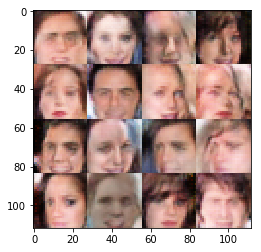

Epoch 1/5... Discriminator Loss: 1.3207... Generator Loss: 0.7369
Epoch 1/5... Discriminator Loss: 1.3995... Generator Loss: 1.1882
Epoch 1/5... Discriminator Loss: 1.3401... Generator Loss: 0.4928
Epoch 1/5... Discriminator Loss: 1.2189... Generator Loss: 0.7680
Epoch 1/5... Discriminator Loss: 1.2471... Generator Loss: 0.6726


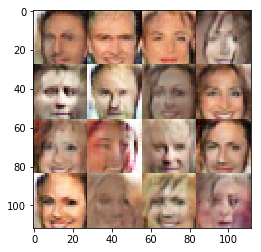

Epoch 1/5... Discriminator Loss: 1.3469... Generator Loss: 0.4930
Epoch 1/5... Discriminator Loss: 1.2295... Generator Loss: 0.6416
Epoch 1/5... Discriminator Loss: 1.4577... Generator Loss: 0.4513
Epoch 1/5... Discriminator Loss: 1.2495... Generator Loss: 0.7075
Epoch 1/5... Discriminator Loss: 1.3804... Generator Loss: 0.4715


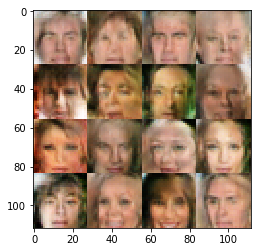

Epoch 1/5... Discriminator Loss: 1.3021... Generator Loss: 0.9317
Epoch 1/5... Discriminator Loss: 1.2427... Generator Loss: 0.6576
Epoch 1/5... Discriminator Loss: 1.3992... Generator Loss: 0.4453
Epoch 1/5... Discriminator Loss: 1.6479... Generator Loss: 0.3433
Epoch 1/5... Discriminator Loss: 1.6058... Generator Loss: 0.3725


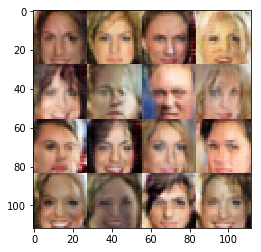

Epoch 1/5... Discriminator Loss: 1.3719... Generator Loss: 0.4710
Epoch 1/5... Discriminator Loss: 1.2751... Generator Loss: 0.5942
Epoch 1/5... Discriminator Loss: 1.1345... Generator Loss: 0.6641
Epoch 1/5... Discriminator Loss: 1.2078... Generator Loss: 0.6987
Epoch 1/5... Discriminator Loss: 1.2081... Generator Loss: 0.9923


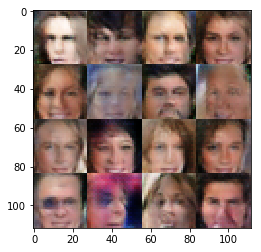

Epoch 1/5... Discriminator Loss: 1.3495... Generator Loss: 1.0975
Epoch 1/5... Discriminator Loss: 1.3651... Generator Loss: 0.5691
Epoch 1/5... Discriminator Loss: 1.3529... Generator Loss: 0.5376
Epoch 1/5... Discriminator Loss: 1.2267... Generator Loss: 0.7766
Epoch 1/5... Discriminator Loss: 1.3156... Generator Loss: 0.4885


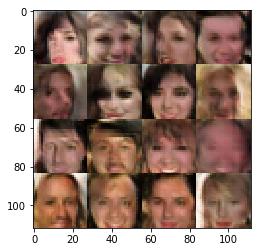

Epoch 1/5... Discriminator Loss: 1.3973... Generator Loss: 0.5917
Epoch 1/5... Discriminator Loss: 1.2391... Generator Loss: 0.9462
Epoch 1/5... Discriminator Loss: 1.3169... Generator Loss: 0.5872
Epoch 1/5... Discriminator Loss: 1.4291... Generator Loss: 0.4110
Epoch 1/5... Discriminator Loss: 1.2133... Generator Loss: 0.7504


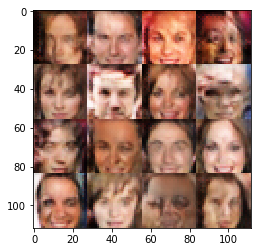

Epoch 1/5... Discriminator Loss: 1.2580... Generator Loss: 0.8511
Epoch 1/5... Discriminator Loss: 1.4706... Generator Loss: 0.4841
Epoch 1/5... Discriminator Loss: 1.5022... Generator Loss: 0.4180
Epoch 1/5... Discriminator Loss: 1.2573... Generator Loss: 0.7107
Epoch 1/5... Discriminator Loss: 1.3656... Generator Loss: 0.5247


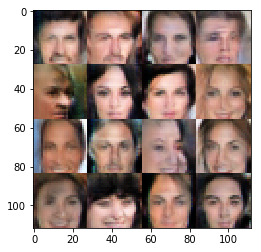

Epoch 1/5... Discriminator Loss: 1.3717... Generator Loss: 0.6072
Epoch 1/5... Discriminator Loss: 1.3860... Generator Loss: 0.4781
Epoch 1/5... Discriminator Loss: 1.3356... Generator Loss: 0.6132
Epoch 1/5... Discriminator Loss: 1.3361... Generator Loss: 0.5776
Epoch 1/5... Discriminator Loss: 1.1730... Generator Loss: 0.8858


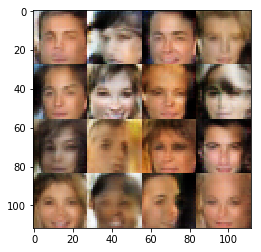

Epoch 1/5... Discriminator Loss: 1.3790... Generator Loss: 0.5708
Epoch 1/5... Discriminator Loss: 1.2584... Generator Loss: 0.6773
Epoch 1/5... Discriminator Loss: 1.3340... Generator Loss: 0.7009
Epoch 2/5... Discriminator Loss: 1.6934... Generator Loss: 0.3644
Epoch 2/5... Discriminator Loss: 1.3683... Generator Loss: 0.5927


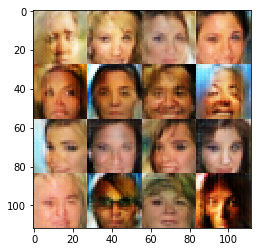

Epoch 2/5... Discriminator Loss: 1.4637... Generator Loss: 0.4348
Epoch 2/5... Discriminator Loss: 1.8704... Generator Loss: 0.2283
Epoch 2/5... Discriminator Loss: 1.4312... Generator Loss: 1.0522
Epoch 2/5... Discriminator Loss: 1.2143... Generator Loss: 0.7760
Epoch 2/5... Discriminator Loss: 1.2300... Generator Loss: 1.1096


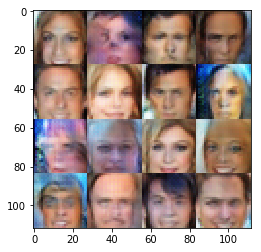

Epoch 2/5... Discriminator Loss: 1.2361... Generator Loss: 0.7378
Epoch 2/5... Discriminator Loss: 1.2365... Generator Loss: 0.9528
Epoch 2/5... Discriminator Loss: 1.3907... Generator Loss: 0.5496
Epoch 2/5... Discriminator Loss: 1.2763... Generator Loss: 0.5408
Epoch 2/5... Discriminator Loss: 1.2280... Generator Loss: 0.9820


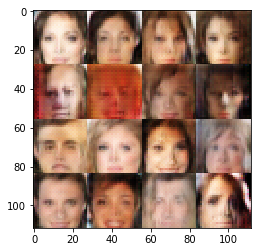

Epoch 2/5... Discriminator Loss: 1.1961... Generator Loss: 0.6169
Epoch 2/5... Discriminator Loss: 1.3414... Generator Loss: 0.5373
Epoch 2/5... Discriminator Loss: 1.3170... Generator Loss: 0.6716
Epoch 2/5... Discriminator Loss: 1.3634... Generator Loss: 0.6587
Epoch 2/5... Discriminator Loss: 1.5544... Generator Loss: 0.4171


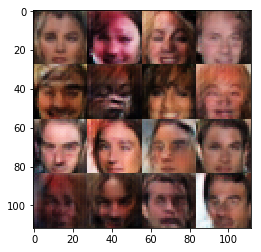

Epoch 2/5... Discriminator Loss: 1.2945... Generator Loss: 0.6576
Epoch 2/5... Discriminator Loss: 1.3373... Generator Loss: 0.8324
Epoch 2/5... Discriminator Loss: 1.4455... Generator Loss: 0.4909
Epoch 2/5... Discriminator Loss: 1.2572... Generator Loss: 0.6326
Epoch 2/5... Discriminator Loss: 1.4448... Generator Loss: 0.4477


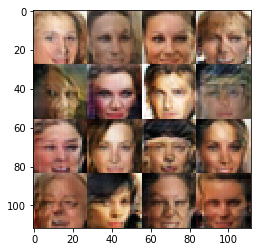

Epoch 2/5... Discriminator Loss: 1.3629... Generator Loss: 0.6482
Epoch 2/5... Discriminator Loss: 1.3469... Generator Loss: 0.7397
Epoch 2/5... Discriminator Loss: 1.4450... Generator Loss: 0.4371
Epoch 2/5... Discriminator Loss: 1.2839... Generator Loss: 0.8317
Epoch 2/5... Discriminator Loss: 1.3209... Generator Loss: 0.5882


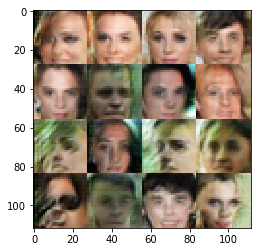

Epoch 2/5... Discriminator Loss: 1.2743... Generator Loss: 0.8073
Epoch 2/5... Discriminator Loss: 1.2431... Generator Loss: 1.0495
Epoch 2/5... Discriminator Loss: 1.4081... Generator Loss: 0.5704
Epoch 2/5... Discriminator Loss: 1.4751... Generator Loss: 0.8358
Epoch 2/5... Discriminator Loss: 1.5272... Generator Loss: 0.4913


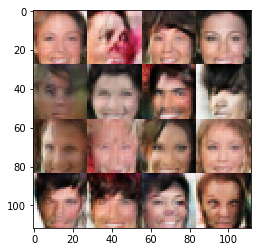

Epoch 2/5... Discriminator Loss: 1.3527... Generator Loss: 0.7411
Epoch 2/5... Discriminator Loss: 1.5921... Generator Loss: 0.3829
Epoch 2/5... Discriminator Loss: 1.2818... Generator Loss: 0.9584
Epoch 2/5... Discriminator Loss: 1.4720... Generator Loss: 0.8028
Epoch 2/5... Discriminator Loss: 1.4080... Generator Loss: 0.6041


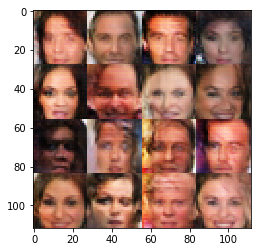

Epoch 2/5... Discriminator Loss: 1.3634... Generator Loss: 0.5911
Epoch 2/5... Discriminator Loss: 1.2982... Generator Loss: 0.8288
Epoch 2/5... Discriminator Loss: 1.2827... Generator Loss: 0.7119
Epoch 2/5... Discriminator Loss: 1.4729... Generator Loss: 0.7322
Epoch 2/5... Discriminator Loss: 1.4079... Generator Loss: 0.7983


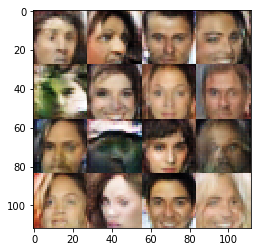

Epoch 2/5... Discriminator Loss: 1.2759... Generator Loss: 0.6256
Epoch 2/5... Discriminator Loss: 1.4681... Generator Loss: 0.4754
Epoch 2/5... Discriminator Loss: 1.4398... Generator Loss: 0.4930
Epoch 2/5... Discriminator Loss: 1.4329... Generator Loss: 0.4231
Epoch 2/5... Discriminator Loss: 1.4217... Generator Loss: 0.4260


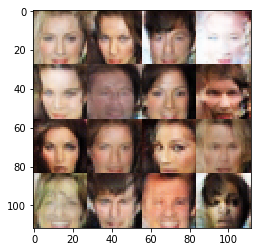

Epoch 2/5... Discriminator Loss: 1.2545... Generator Loss: 0.7112
Epoch 2/5... Discriminator Loss: 1.3216... Generator Loss: 0.6039
Epoch 2/5... Discriminator Loss: 1.4798... Generator Loss: 0.4839
Epoch 2/5... Discriminator Loss: 1.3671... Generator Loss: 0.6439
Epoch 2/5... Discriminator Loss: 1.4439... Generator Loss: 0.6168


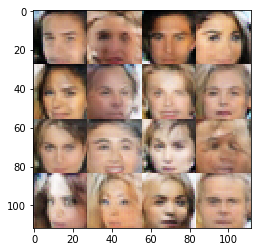

Epoch 2/5... Discriminator Loss: 1.4598... Generator Loss: 0.3796
Epoch 2/5... Discriminator Loss: 1.5634... Generator Loss: 0.4220
Epoch 2/5... Discriminator Loss: 1.3652... Generator Loss: 0.5985
Epoch 2/5... Discriminator Loss: 1.4414... Generator Loss: 0.4861
Epoch 2/5... Discriminator Loss: 1.1837... Generator Loss: 0.9192


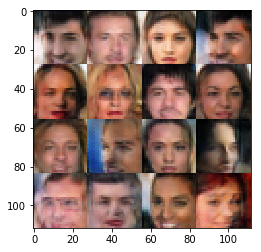

Epoch 2/5... Discriminator Loss: 1.3079... Generator Loss: 0.7245
Epoch 2/5... Discriminator Loss: 1.5206... Generator Loss: 0.3776
Epoch 2/5... Discriminator Loss: 1.2024... Generator Loss: 0.8304
Epoch 2/5... Discriminator Loss: 1.2260... Generator Loss: 0.9246
Epoch 2/5... Discriminator Loss: 1.5226... Generator Loss: 0.4121


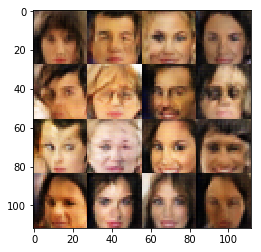

Epoch 2/5... Discriminator Loss: 1.4787... Generator Loss: 0.5111
Epoch 2/5... Discriminator Loss: 1.2977... Generator Loss: 0.6082
Epoch 2/5... Discriminator Loss: 1.6667... Generator Loss: 0.3464
Epoch 2/5... Discriminator Loss: 1.3800... Generator Loss: 0.4917
Epoch 2/5... Discriminator Loss: 1.3213... Generator Loss: 0.5733


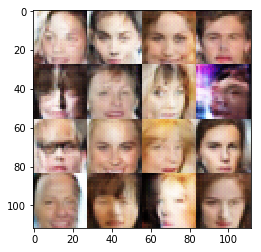

Epoch 2/5... Discriminator Loss: 1.5190... Generator Loss: 0.4891
Epoch 2/5... Discriminator Loss: 1.4313... Generator Loss: 0.7365
Epoch 2/5... Discriminator Loss: 1.2919... Generator Loss: 0.6297
Epoch 2/5... Discriminator Loss: 1.2905... Generator Loss: 0.7172
Epoch 2/5... Discriminator Loss: 1.4156... Generator Loss: 0.4721


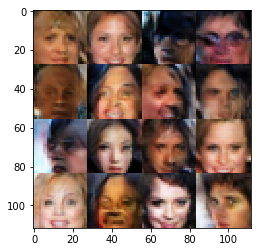

Epoch 2/5... Discriminator Loss: 1.4013... Generator Loss: 0.5035
Epoch 2/5... Discriminator Loss: 1.2957... Generator Loss: 0.5998
Epoch 2/5... Discriminator Loss: 1.5069... Generator Loss: 0.4325
Epoch 2/5... Discriminator Loss: 1.4850... Generator Loss: 0.5366
Epoch 2/5... Discriminator Loss: 1.3938... Generator Loss: 0.5605


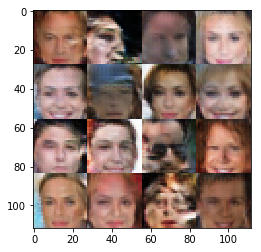

Epoch 2/5... Discriminator Loss: 1.4118... Generator Loss: 0.4914
Epoch 2/5... Discriminator Loss: 1.3977... Generator Loss: 0.5864
Epoch 2/5... Discriminator Loss: 1.3241... Generator Loss: 0.7583
Epoch 2/5... Discriminator Loss: 1.5396... Generator Loss: 0.3737
Epoch 2/5... Discriminator Loss: 1.3623... Generator Loss: 0.5131


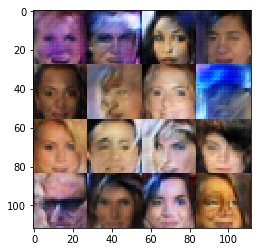

Epoch 2/5... Discriminator Loss: 1.5398... Generator Loss: 0.5030
Epoch 2/5... Discriminator Loss: 1.5014... Generator Loss: 0.9408
Epoch 2/5... Discriminator Loss: 1.2380... Generator Loss: 0.5974
Epoch 2/5... Discriminator Loss: 1.4746... Generator Loss: 0.5032
Epoch 2/5... Discriminator Loss: 1.3518... Generator Loss: 0.6043


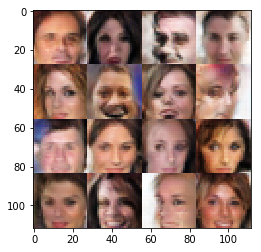

Epoch 2/5... Discriminator Loss: 1.4149... Generator Loss: 0.5768
Epoch 2/5... Discriminator Loss: 1.2735... Generator Loss: 0.9146
Epoch 2/5... Discriminator Loss: 1.6453... Generator Loss: 0.3517
Epoch 2/5... Discriminator Loss: 1.2894... Generator Loss: 0.6625
Epoch 2/5... Discriminator Loss: 1.5151... Generator Loss: 0.4266


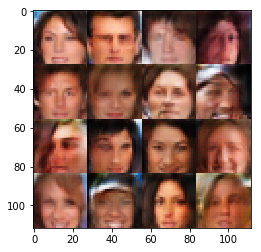

Epoch 2/5... Discriminator Loss: 1.4768... Generator Loss: 0.4443
Epoch 2/5... Discriminator Loss: 1.4825... Generator Loss: 0.4733
Epoch 2/5... Discriminator Loss: 1.3814... Generator Loss: 0.5852
Epoch 2/5... Discriminator Loss: 1.4190... Generator Loss: 0.5529
Epoch 2/5... Discriminator Loss: 1.2866... Generator Loss: 0.6580


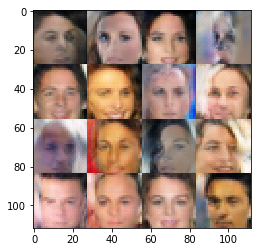

Epoch 2/5... Discriminator Loss: 1.4672... Generator Loss: 0.4997
Epoch 2/5... Discriminator Loss: 1.4238... Generator Loss: 0.4959
Epoch 2/5... Discriminator Loss: 1.4793... Generator Loss: 0.4587
Epoch 2/5... Discriminator Loss: 1.3233... Generator Loss: 0.4907
Epoch 2/5... Discriminator Loss: 1.4343... Generator Loss: 0.4743


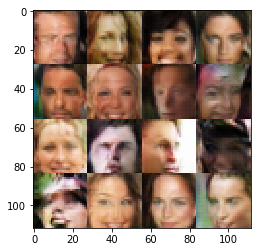

Epoch 2/5... Discriminator Loss: 1.2641... Generator Loss: 0.7515
Epoch 2/5... Discriminator Loss: 1.4349... Generator Loss: 0.4800
Epoch 2/5... Discriminator Loss: 1.5257... Generator Loss: 0.4269
Epoch 2/5... Discriminator Loss: 1.2896... Generator Loss: 0.6656
Epoch 2/5... Discriminator Loss: 1.4650... Generator Loss: 0.4666


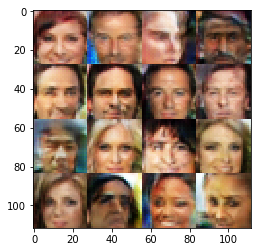

Epoch 2/5... Discriminator Loss: 1.2736... Generator Loss: 0.8169
Epoch 2/5... Discriminator Loss: 1.4502... Generator Loss: 0.5568
Epoch 2/5... Discriminator Loss: 1.7303... Generator Loss: 0.2951
Epoch 2/5... Discriminator Loss: 1.4852... Generator Loss: 0.4278
Epoch 2/5... Discriminator Loss: 1.4010... Generator Loss: 0.5381


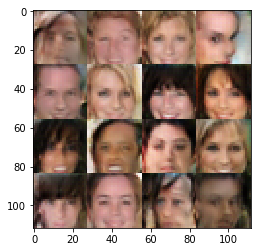

Epoch 2/5... Discriminator Loss: 1.4615... Generator Loss: 0.4445
Epoch 2/5... Discriminator Loss: 1.3776... Generator Loss: 0.5282
Epoch 2/5... Discriminator Loss: 1.2848... Generator Loss: 0.5883
Epoch 2/5... Discriminator Loss: 1.2627... Generator Loss: 0.6631
Epoch 2/5... Discriminator Loss: 1.5439... Generator Loss: 0.6380


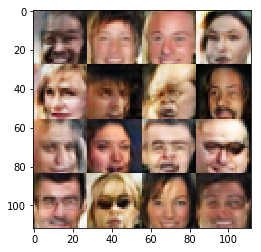

Epoch 2/5... Discriminator Loss: 1.3751... Generator Loss: 0.9419
Epoch 2/5... Discriminator Loss: 1.3386... Generator Loss: 0.7025
Epoch 2/5... Discriminator Loss: 1.3652... Generator Loss: 0.6159
Epoch 2/5... Discriminator Loss: 1.3426... Generator Loss: 0.7073
Epoch 2/5... Discriminator Loss: 1.4716... Generator Loss: 0.4709


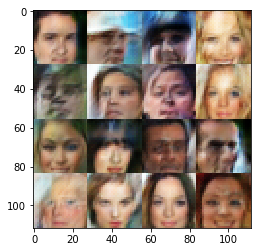

Epoch 2/5... Discriminator Loss: 1.4347... Generator Loss: 0.4882
Epoch 2/5... Discriminator Loss: 1.4880... Generator Loss: 0.5230
Epoch 2/5... Discriminator Loss: 1.3486... Generator Loss: 0.5692
Epoch 2/5... Discriminator Loss: 1.4878... Generator Loss: 0.4746
Epoch 2/5... Discriminator Loss: 1.5774... Generator Loss: 0.4611


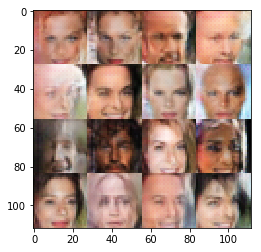

Epoch 2/5... Discriminator Loss: 1.3889... Generator Loss: 0.6735
Epoch 2/5... Discriminator Loss: 1.5285... Generator Loss: 0.4769
Epoch 2/5... Discriminator Loss: 1.4549... Generator Loss: 0.6403
Epoch 2/5... Discriminator Loss: 1.3949... Generator Loss: 0.6346
Epoch 2/5... Discriminator Loss: 1.4511... Generator Loss: 0.4643


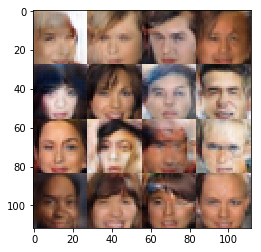

Epoch 2/5... Discriminator Loss: 1.2975... Generator Loss: 0.7512
Epoch 2/5... Discriminator Loss: 1.4341... Generator Loss: 0.5853
Epoch 2/5... Discriminator Loss: 1.5423... Generator Loss: 0.3755
Epoch 2/5... Discriminator Loss: 1.5125... Generator Loss: 0.8275
Epoch 2/5... Discriminator Loss: 1.5241... Generator Loss: 0.5160


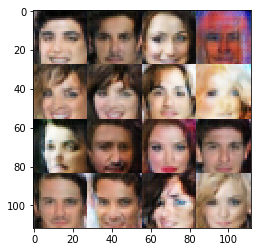

Epoch 2/5... Discriminator Loss: 1.3745... Generator Loss: 0.6452
Epoch 2/5... Discriminator Loss: 1.4354... Generator Loss: 0.4765
Epoch 2/5... Discriminator Loss: 1.5343... Generator Loss: 0.5117
Epoch 2/5... Discriminator Loss: 1.5406... Generator Loss: 0.5365
Epoch 2/5... Discriminator Loss: 1.2862... Generator Loss: 0.8980


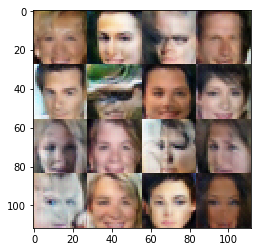

Epoch 2/5... Discriminator Loss: 1.3854... Generator Loss: 0.6029
Epoch 2/5... Discriminator Loss: 1.3863... Generator Loss: 0.6124
Epoch 2/5... Discriminator Loss: 1.4548... Generator Loss: 0.9471
Epoch 2/5... Discriminator Loss: 1.5120... Generator Loss: 0.5000
Epoch 2/5... Discriminator Loss: 1.5666... Generator Loss: 0.3778


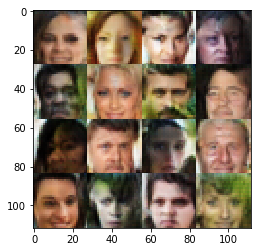

Epoch 2/5... Discriminator Loss: 1.5145... Generator Loss: 0.3972
Epoch 2/5... Discriminator Loss: 1.4642... Generator Loss: 0.6384
Epoch 2/5... Discriminator Loss: 1.3982... Generator Loss: 0.5300
Epoch 2/5... Discriminator Loss: 1.5654... Generator Loss: 0.3742
Epoch 2/5... Discriminator Loss: 1.2806... Generator Loss: 0.6253


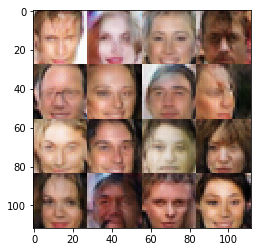

Epoch 2/5... Discriminator Loss: 1.4629... Generator Loss: 0.4998
Epoch 2/5... Discriminator Loss: 1.4673... Generator Loss: 0.8490
Epoch 2/5... Discriminator Loss: 1.3471... Generator Loss: 0.5481
Epoch 2/5... Discriminator Loss: 1.2334... Generator Loss: 0.6119
Epoch 2/5... Discriminator Loss: 1.3248... Generator Loss: 0.5365


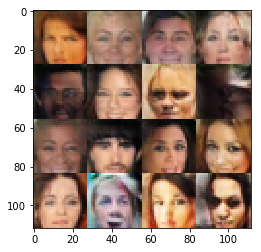

Epoch 2/5... Discriminator Loss: 1.3709... Generator Loss: 0.5747
Epoch 3/5... Discriminator Loss: 1.2494... Generator Loss: 0.6944
Epoch 3/5... Discriminator Loss: 1.3315... Generator Loss: 0.9200
Epoch 3/5... Discriminator Loss: 1.5649... Generator Loss: 0.4677
Epoch 3/5... Discriminator Loss: 1.2405... Generator Loss: 0.7046


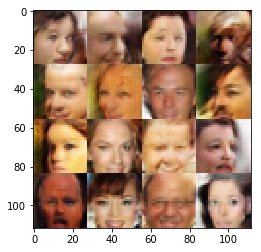

Epoch 3/5... Discriminator Loss: 1.6815... Generator Loss: 0.3960
Epoch 3/5... Discriminator Loss: 1.4086... Generator Loss: 0.5086
Epoch 3/5... Discriminator Loss: 1.5311... Generator Loss: 0.4280
Epoch 3/5... Discriminator Loss: 1.5721... Generator Loss: 0.3697
Epoch 3/5... Discriminator Loss: 1.6848... Generator Loss: 0.4181


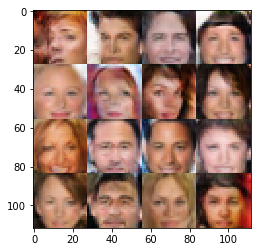

Epoch 3/5... Discriminator Loss: 1.5966... Generator Loss: 0.3721
Epoch 3/5... Discriminator Loss: 1.4844... Generator Loss: 0.6562
Epoch 3/5... Discriminator Loss: 1.5664... Generator Loss: 0.3528
Epoch 3/5... Discriminator Loss: 1.5312... Generator Loss: 0.3865
Epoch 3/5... Discriminator Loss: 1.5820... Generator Loss: 0.3363


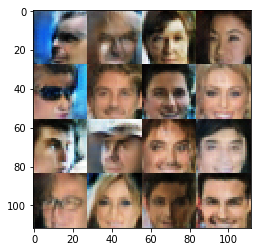

Epoch 3/5... Discriminator Loss: 1.5103... Generator Loss: 0.6127
Epoch 3/5... Discriminator Loss: 1.3057... Generator Loss: 0.8268
Epoch 3/5... Discriminator Loss: 1.5548... Generator Loss: 0.4396
Epoch 3/5... Discriminator Loss: 1.3630... Generator Loss: 0.5106
Epoch 3/5... Discriminator Loss: 1.4197... Generator Loss: 0.4697


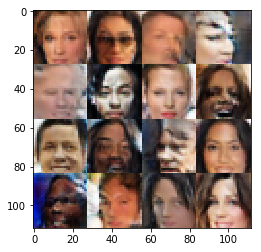

Epoch 3/5... Discriminator Loss: 1.3527... Generator Loss: 0.5839
Epoch 3/5... Discriminator Loss: 1.5641... Generator Loss: 0.3668
Epoch 3/5... Discriminator Loss: 1.4405... Generator Loss: 0.5219
Epoch 3/5... Discriminator Loss: 1.6708... Generator Loss: 0.3024
Epoch 3/5... Discriminator Loss: 1.5227... Generator Loss: 0.4195


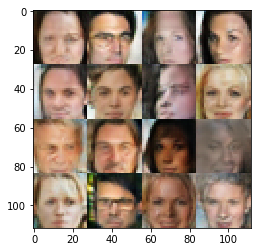

Epoch 3/5... Discriminator Loss: 1.6299... Generator Loss: 0.3758
Epoch 3/5... Discriminator Loss: 1.4124... Generator Loss: 0.6265
Epoch 3/5... Discriminator Loss: 1.4169... Generator Loss: 0.6706
Epoch 3/5... Discriminator Loss: 1.5129... Generator Loss: 0.4466
Epoch 3/5... Discriminator Loss: 1.4694... Generator Loss: 0.4581


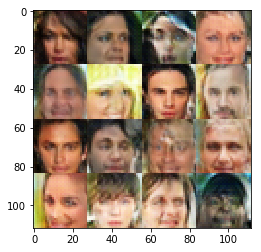

Epoch 3/5... Discriminator Loss: 1.4176... Generator Loss: 0.6729
Epoch 3/5... Discriminator Loss: 1.5442... Generator Loss: 0.4355
Epoch 3/5... Discriminator Loss: 1.5467... Generator Loss: 0.4201
Epoch 3/5... Discriminator Loss: 1.3644... Generator Loss: 0.5363
Epoch 3/5... Discriminator Loss: 1.5907... Generator Loss: 0.4134


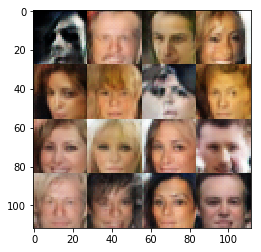

Epoch 3/5... Discriminator Loss: 1.7087... Generator Loss: 0.3323
Epoch 3/5... Discriminator Loss: 1.4401... Generator Loss: 0.5216
Epoch 3/5... Discriminator Loss: 1.4201... Generator Loss: 0.5321
Epoch 3/5... Discriminator Loss: 1.5956... Generator Loss: 0.3831
Epoch 3/5... Discriminator Loss: 1.7291... Generator Loss: 0.2974


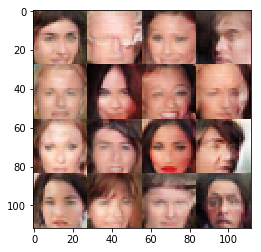

Epoch 3/5... Discriminator Loss: 1.5671... Generator Loss: 0.3925
Epoch 3/5... Discriminator Loss: 1.4895... Generator Loss: 0.4875
Epoch 3/5... Discriminator Loss: 1.4950... Generator Loss: 0.6155
Epoch 3/5... Discriminator Loss: 1.4761... Generator Loss: 0.4631
Epoch 3/5... Discriminator Loss: 1.5012... Generator Loss: 0.4802


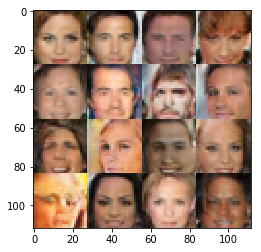

Epoch 3/5... Discriminator Loss: 1.5497... Generator Loss: 0.4150
Epoch 3/5... Discriminator Loss: 1.5300... Generator Loss: 0.3867
Epoch 3/5... Discriminator Loss: 1.3427... Generator Loss: 0.6091
Epoch 3/5... Discriminator Loss: 1.5094... Generator Loss: 0.4428
Epoch 3/5... Discriminator Loss: 1.4874... Generator Loss: 0.5741


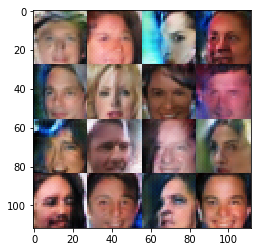

Epoch 3/5... Discriminator Loss: 1.3767... Generator Loss: 0.5600
Epoch 3/5... Discriminator Loss: 1.3345... Generator Loss: 0.9154
Epoch 3/5... Discriminator Loss: 1.3903... Generator Loss: 0.4302
Epoch 3/5... Discriminator Loss: 1.6259... Generator Loss: 0.3404
Epoch 3/5... Discriminator Loss: 1.4627... Generator Loss: 0.5454


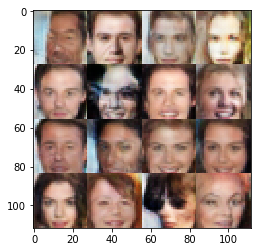

Epoch 3/5... Discriminator Loss: 1.5545... Generator Loss: 0.4724
Epoch 3/5... Discriminator Loss: 1.6096... Generator Loss: 0.3864
Epoch 3/5... Discriminator Loss: 1.4507... Generator Loss: 0.5442
Epoch 3/5... Discriminator Loss: 1.4411... Generator Loss: 0.5850
Epoch 3/5... Discriminator Loss: 1.4610... Generator Loss: 0.4552


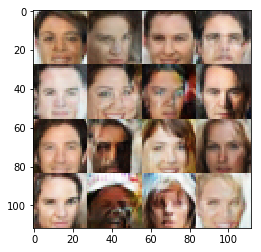

Epoch 3/5... Discriminator Loss: 1.5897... Generator Loss: 0.4598
Epoch 3/5... Discriminator Loss: 1.5406... Generator Loss: 0.3655
Epoch 3/5... Discriminator Loss: 1.5307... Generator Loss: 0.4213
Epoch 3/5... Discriminator Loss: 1.5855... Generator Loss: 0.3872
Epoch 3/5... Discriminator Loss: 1.5709... Generator Loss: 0.4327


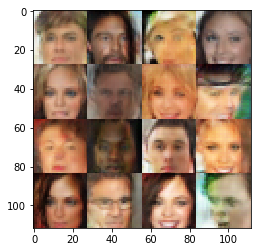

Epoch 3/5... Discriminator Loss: 1.5018... Generator Loss: 0.4104
Epoch 3/5... Discriminator Loss: 1.5959... Generator Loss: 0.4693
Epoch 3/5... Discriminator Loss: 1.7294... Generator Loss: 0.2993
Epoch 3/5... Discriminator Loss: 1.9604... Generator Loss: 0.2117
Epoch 3/5... Discriminator Loss: 1.3302... Generator Loss: 0.5630


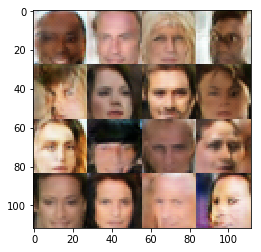

Epoch 3/5... Discriminator Loss: 1.5092... Generator Loss: 0.4737
Epoch 3/5... Discriminator Loss: 1.4883... Generator Loss: 0.5481
Epoch 3/5... Discriminator Loss: 1.6179... Generator Loss: 0.3984
Epoch 3/5... Discriminator Loss: 1.5190... Generator Loss: 0.4608
Epoch 3/5... Discriminator Loss: 1.4031... Generator Loss: 0.4519


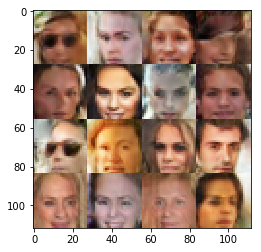

Epoch 3/5... Discriminator Loss: 1.4503... Generator Loss: 0.5287
Epoch 3/5... Discriminator Loss: 1.6235... Generator Loss: 0.3907
Epoch 3/5... Discriminator Loss: 1.7848... Generator Loss: 0.2663
Epoch 3/5... Discriminator Loss: 1.3779... Generator Loss: 0.5518
Epoch 3/5... Discriminator Loss: 1.4534... Generator Loss: 0.6950


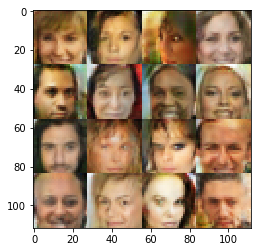

Epoch 3/5... Discriminator Loss: 1.6209... Generator Loss: 0.4543
Epoch 3/5... Discriminator Loss: 1.7664... Generator Loss: 0.3806
Epoch 3/5... Discriminator Loss: 1.4399... Generator Loss: 0.4916
Epoch 3/5... Discriminator Loss: 1.9835... Generator Loss: 0.2379
Epoch 3/5... Discriminator Loss: 1.5464... Generator Loss: 0.4137


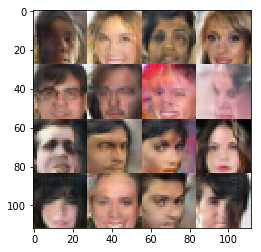

Epoch 3/5... Discriminator Loss: 1.4918... Generator Loss: 0.5141
Epoch 3/5... Discriminator Loss: 1.5647... Generator Loss: 0.4732
Epoch 3/5... Discriminator Loss: 1.5109... Generator Loss: 0.7526
Epoch 3/5... Discriminator Loss: 1.5612... Generator Loss: 0.4768
Epoch 3/5... Discriminator Loss: 1.4081... Generator Loss: 0.5796


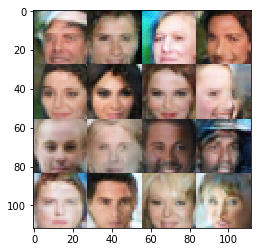

Epoch 3/5... Discriminator Loss: 1.6954... Generator Loss: 0.3487
Epoch 3/5... Discriminator Loss: 1.3900... Generator Loss: 0.6514
Epoch 3/5... Discriminator Loss: 1.6756... Generator Loss: 0.4340
Epoch 3/5... Discriminator Loss: 1.4291... Generator Loss: 0.4689
Epoch 3/5... Discriminator Loss: 1.4576... Generator Loss: 0.5228


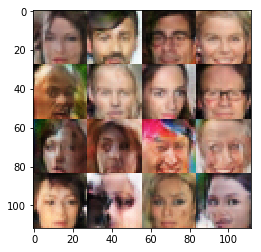

Epoch 3/5... Discriminator Loss: 1.6156... Generator Loss: 0.4581
Epoch 3/5... Discriminator Loss: 1.3997... Generator Loss: 0.5577
Epoch 3/5... Discriminator Loss: 1.4322... Generator Loss: 0.6482
Epoch 3/5... Discriminator Loss: 1.5646... Generator Loss: 0.4553
Epoch 3/5... Discriminator Loss: 1.4031... Generator Loss: 0.4919


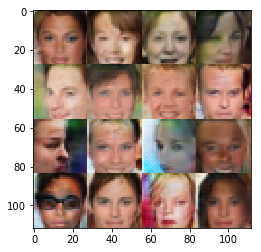

Epoch 3/5... Discriminator Loss: 1.6634... Generator Loss: 0.3709
Epoch 3/5... Discriminator Loss: 2.0340... Generator Loss: 0.2237
Epoch 3/5... Discriminator Loss: 1.3529... Generator Loss: 0.5536
Epoch 3/5... Discriminator Loss: 1.4346... Generator Loss: 0.4542
Epoch 3/5... Discriminator Loss: 1.5606... Generator Loss: 0.4146


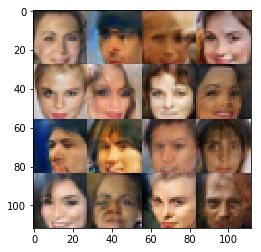

Epoch 3/5... Discriminator Loss: 1.8612... Generator Loss: 0.2686
Epoch 3/5... Discriminator Loss: 1.4139... Generator Loss: 0.5933
Epoch 3/5... Discriminator Loss: 1.7114... Generator Loss: 0.2972
Epoch 3/5... Discriminator Loss: 1.8205... Generator Loss: 0.2866
Epoch 3/5... Discriminator Loss: 1.6195... Generator Loss: 0.3885


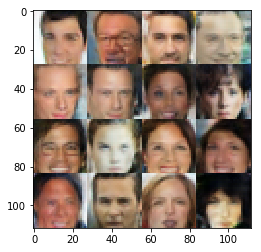

Epoch 3/5... Discriminator Loss: 1.4682... Generator Loss: 0.4634
Epoch 3/5... Discriminator Loss: 1.6985... Generator Loss: 0.4227
Epoch 3/5... Discriminator Loss: 1.5330... Generator Loss: 0.5250
Epoch 3/5... Discriminator Loss: 1.7305... Generator Loss: 0.3137
Epoch 3/5... Discriminator Loss: 1.3992... Generator Loss: 0.4500


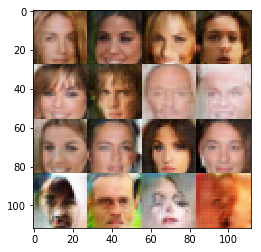

Epoch 3/5... Discriminator Loss: 1.5167... Generator Loss: 0.4308
Epoch 3/5... Discriminator Loss: 1.4878... Generator Loss: 0.4088
Epoch 3/5... Discriminator Loss: 1.9459... Generator Loss: 0.2235
Epoch 3/5... Discriminator Loss: 1.4583... Generator Loss: 0.7390
Epoch 3/5... Discriminator Loss: 1.7384... Generator Loss: 0.3159


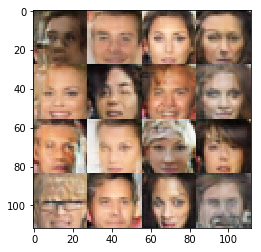

Epoch 3/5... Discriminator Loss: 1.5014... Generator Loss: 0.4940
Epoch 3/5... Discriminator Loss: 1.6807... Generator Loss: 0.3325
Epoch 3/5... Discriminator Loss: 1.4895... Generator Loss: 0.4561
Epoch 3/5... Discriminator Loss: 1.6067... Generator Loss: 0.4261
Epoch 3/5... Discriminator Loss: 1.7263... Generator Loss: 0.2972


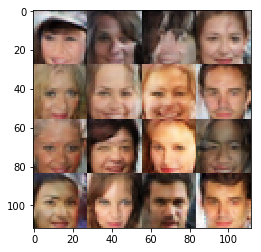

Epoch 3/5... Discriminator Loss: 1.5374... Generator Loss: 0.4760
Epoch 3/5... Discriminator Loss: 1.7174... Generator Loss: 0.3722
Epoch 3/5... Discriminator Loss: 1.6169... Generator Loss: 0.4130
Epoch 3/5... Discriminator Loss: 1.6192... Generator Loss: 0.3861
Epoch 3/5... Discriminator Loss: 1.6006... Generator Loss: 0.4431


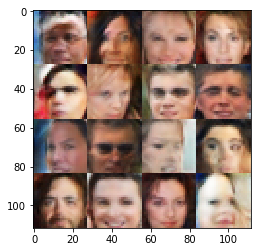

Epoch 3/5... Discriminator Loss: 1.6689... Generator Loss: 0.3924
Epoch 3/5... Discriminator Loss: 1.5031... Generator Loss: 0.4399
Epoch 3/5... Discriminator Loss: 1.4458... Generator Loss: 0.4947
Epoch 3/5... Discriminator Loss: 1.4756... Generator Loss: 0.5094
Epoch 3/5... Discriminator Loss: 1.4709... Generator Loss: 0.4732


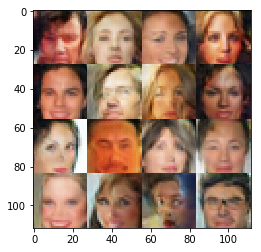

Epoch 3/5... Discriminator Loss: 1.6222... Generator Loss: 0.4165
Epoch 3/5... Discriminator Loss: 1.5977... Generator Loss: 0.3967
Epoch 3/5... Discriminator Loss: 1.5566... Generator Loss: 0.3740
Epoch 3/5... Discriminator Loss: 1.4283... Generator Loss: 0.5286
Epoch 3/5... Discriminator Loss: 1.4589... Generator Loss: 0.4858


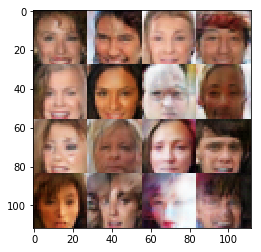

Epoch 3/5... Discriminator Loss: 1.3652... Generator Loss: 0.6366
Epoch 3/5... Discriminator Loss: 1.4039... Generator Loss: 0.5431
Epoch 3/5... Discriminator Loss: 1.5462... Generator Loss: 0.3925
Epoch 3/5... Discriminator Loss: 1.5665... Generator Loss: 0.4832
Epoch 3/5... Discriminator Loss: 1.5433... Generator Loss: 0.4285


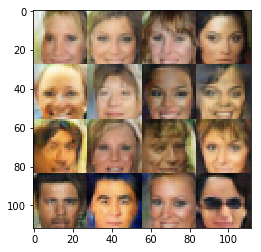

Epoch 3/5... Discriminator Loss: 1.4137... Generator Loss: 0.6057
Epoch 3/5... Discriminator Loss: 1.3924... Generator Loss: 0.5037
Epoch 3/5... Discriminator Loss: 1.2768... Generator Loss: 0.6756
Epoch 3/5... Discriminator Loss: 1.5871... Generator Loss: 0.4368
Epoch 3/5... Discriminator Loss: 1.6087... Generator Loss: 0.4025


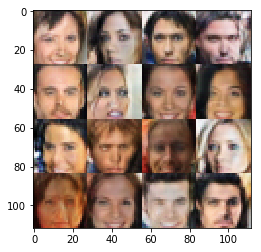

Epoch 3/5... Discriminator Loss: 1.3974... Generator Loss: 0.7194
Epoch 3/5... Discriminator Loss: 1.6710... Generator Loss: 0.3470
Epoch 3/5... Discriminator Loss: 1.5942... Generator Loss: 0.4473
Epoch 3/5... Discriminator Loss: 1.6525... Generator Loss: 0.3422
Epoch 3/5... Discriminator Loss: 1.3973... Generator Loss: 0.5358


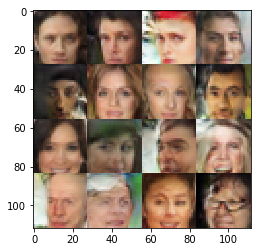

Epoch 3/5... Discriminator Loss: 1.5538... Generator Loss: 0.4351
Epoch 3/5... Discriminator Loss: 1.5422... Generator Loss: 0.4779
Epoch 3/5... Discriminator Loss: 1.4976... Generator Loss: 0.5378
Epoch 3/5... Discriminator Loss: 1.5520... Generator Loss: 0.5873
Epoch 4/5... Discriminator Loss: 1.3107... Generator Loss: 0.6243


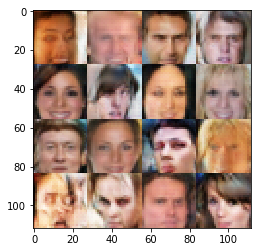

Epoch 4/5... Discriminator Loss: 1.7147... Generator Loss: 0.3758
Epoch 4/5... Discriminator Loss: 1.4860... Generator Loss: 0.4997
Epoch 4/5... Discriminator Loss: 1.6105... Generator Loss: 0.4264
Epoch 4/5... Discriminator Loss: 1.6435... Generator Loss: 0.5115
Epoch 4/5... Discriminator Loss: 1.7268... Generator Loss: 0.2809


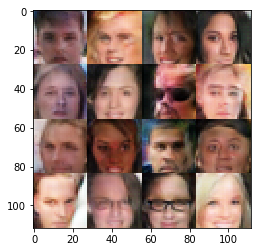

Epoch 4/5... Discriminator Loss: 1.4071... Generator Loss: 0.4719
Epoch 4/5... Discriminator Loss: 1.5813... Generator Loss: 0.3938
Epoch 4/5... Discriminator Loss: 1.5944... Generator Loss: 0.4006
Epoch 4/5... Discriminator Loss: 1.5165... Generator Loss: 0.4219
Epoch 4/5... Discriminator Loss: 1.3373... Generator Loss: 0.7882


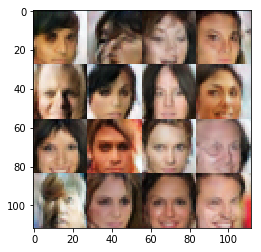

Epoch 4/5... Discriminator Loss: 1.7119... Generator Loss: 0.3577
Epoch 4/5... Discriminator Loss: 1.5907... Generator Loss: 0.3850
Epoch 4/5... Discriminator Loss: 1.6840... Generator Loss: 0.3850
Epoch 4/5... Discriminator Loss: 1.6416... Generator Loss: 0.4126
Epoch 4/5... Discriminator Loss: 1.5696... Generator Loss: 0.5983


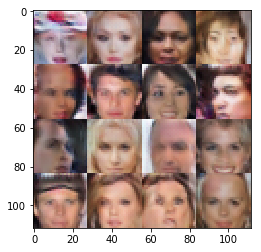

Epoch 4/5... Discriminator Loss: 1.5112... Generator Loss: 0.4033
Epoch 4/5... Discriminator Loss: 1.3287... Generator Loss: 0.6027
Epoch 4/5... Discriminator Loss: 1.5873... Generator Loss: 0.4081
Epoch 4/5... Discriminator Loss: 1.7339... Generator Loss: 0.3200
Epoch 4/5... Discriminator Loss: 1.7872... Generator Loss: 0.2712


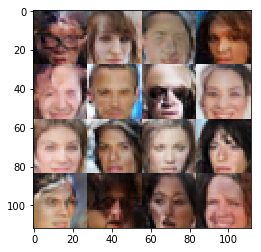

Epoch 4/5... Discriminator Loss: 1.5775... Generator Loss: 0.3839
Epoch 4/5... Discriminator Loss: 1.4109... Generator Loss: 0.4928
Epoch 4/5... Discriminator Loss: 1.6481... Generator Loss: 0.5198
Epoch 4/5... Discriminator Loss: 1.2766... Generator Loss: 0.6008
Epoch 4/5... Discriminator Loss: 1.4663... Generator Loss: 0.4440


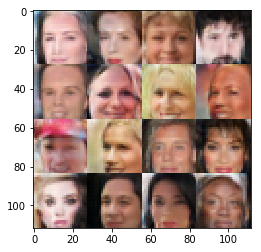

Epoch 4/5... Discriminator Loss: 1.4776... Generator Loss: 0.5432
Epoch 4/5... Discriminator Loss: 1.5455... Generator Loss: 0.4222
Epoch 4/5... Discriminator Loss: 1.5968... Generator Loss: 0.4851
Epoch 4/5... Discriminator Loss: 1.5916... Generator Loss: 0.3708
Epoch 4/5... Discriminator Loss: 1.4051... Generator Loss: 0.5215


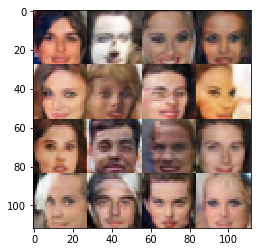

Epoch 4/5... Discriminator Loss: 1.4643... Generator Loss: 0.6314
Epoch 4/5... Discriminator Loss: 1.8627... Generator Loss: 0.2636
Epoch 4/5... Discriminator Loss: 1.5042... Generator Loss: 0.4720
Epoch 4/5... Discriminator Loss: 1.4885... Generator Loss: 0.4558
Epoch 4/5... Discriminator Loss: 1.5743... Generator Loss: 0.5171


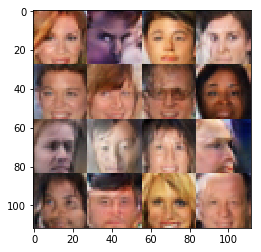

Epoch 4/5... Discriminator Loss: 1.5301... Generator Loss: 0.5506
Epoch 4/5... Discriminator Loss: 1.4702... Generator Loss: 0.4454
Epoch 4/5... Discriminator Loss: 1.4253... Generator Loss: 0.4737
Epoch 4/5... Discriminator Loss: 1.4821... Generator Loss: 0.4245
Epoch 4/5... Discriminator Loss: 1.8380... Generator Loss: 0.2556


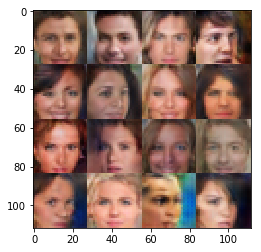

Epoch 4/5... Discriminator Loss: 1.5365... Generator Loss: 0.3944
Epoch 4/5... Discriminator Loss: 1.5812... Generator Loss: 0.4918
Epoch 4/5... Discriminator Loss: 1.5781... Generator Loss: 0.4875
Epoch 4/5... Discriminator Loss: 1.5017... Generator Loss: 0.4734
Epoch 4/5... Discriminator Loss: 1.5487... Generator Loss: 0.5164


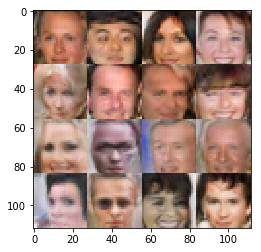

Epoch 4/5... Discriminator Loss: 1.6633... Generator Loss: 0.4664
Epoch 4/5... Discriminator Loss: 1.5479... Generator Loss: 0.4590
Epoch 4/5... Discriminator Loss: 1.6791... Generator Loss: 0.3952
Epoch 4/5... Discriminator Loss: 1.6014... Generator Loss: 0.3533
Epoch 4/5... Discriminator Loss: 1.5123... Generator Loss: 0.3964


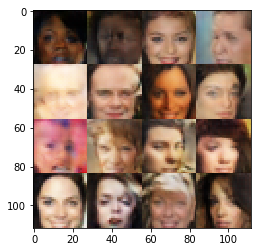

Epoch 4/5... Discriminator Loss: 1.4079... Generator Loss: 0.4950
Epoch 4/5... Discriminator Loss: 1.3973... Generator Loss: 0.5966
Epoch 4/5... Discriminator Loss: 1.6867... Generator Loss: 0.3765
Epoch 4/5... Discriminator Loss: 1.5251... Generator Loss: 0.4561
Epoch 4/5... Discriminator Loss: 1.4443... Generator Loss: 0.6099


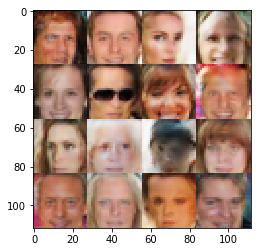

Epoch 4/5... Discriminator Loss: 1.4217... Generator Loss: 0.5100
Epoch 4/5... Discriminator Loss: 1.5853... Generator Loss: 0.4585
Epoch 4/5... Discriminator Loss: 1.4300... Generator Loss: 0.5223
Epoch 4/5... Discriminator Loss: 1.3236... Generator Loss: 0.7075
Epoch 4/5... Discriminator Loss: 1.8295... Generator Loss: 0.3301


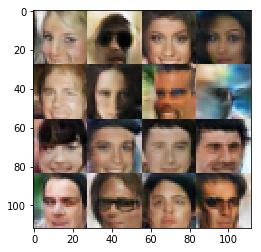

Epoch 4/5... Discriminator Loss: 1.3294... Generator Loss: 0.5594
Epoch 4/5... Discriminator Loss: 1.7815... Generator Loss: 0.3346
Epoch 4/5... Discriminator Loss: 1.6624... Generator Loss: 0.5177
Epoch 4/5... Discriminator Loss: 1.6965... Generator Loss: 0.3758
Epoch 4/5... Discriminator Loss: 1.7043... Generator Loss: 0.4616


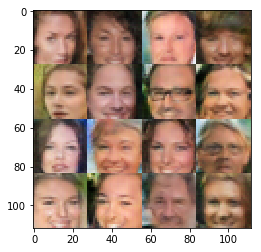

Epoch 4/5... Discriminator Loss: 1.5998... Generator Loss: 0.3711
Epoch 4/5... Discriminator Loss: 1.2914... Generator Loss: 0.7735
Epoch 4/5... Discriminator Loss: 1.5953... Generator Loss: 0.3639
Epoch 4/5... Discriminator Loss: 1.5475... Generator Loss: 0.4580
Epoch 4/5... Discriminator Loss: 1.8860... Generator Loss: 0.2642


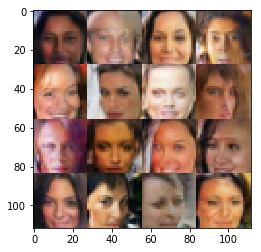

Epoch 4/5... Discriminator Loss: 1.6363... Generator Loss: 0.5049
Epoch 4/5... Discriminator Loss: 1.6148... Generator Loss: 0.4006
Epoch 4/5... Discriminator Loss: 1.8158... Generator Loss: 0.2590
Epoch 4/5... Discriminator Loss: 1.7681... Generator Loss: 0.2827
Epoch 4/5... Discriminator Loss: 1.4815... Generator Loss: 0.5532


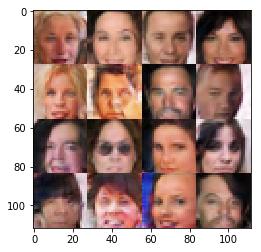

Epoch 4/5... Discriminator Loss: 1.7548... Generator Loss: 0.4750
Epoch 4/5... Discriminator Loss: 1.4713... Generator Loss: 0.4477
Epoch 4/5... Discriminator Loss: 1.5456... Generator Loss: 0.5533
Epoch 4/5... Discriminator Loss: 1.6114... Generator Loss: 0.4456
Epoch 4/5... Discriminator Loss: 1.6015... Generator Loss: 0.4350


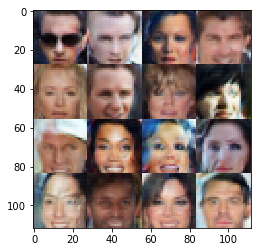

Epoch 4/5... Discriminator Loss: 1.4376... Generator Loss: 0.4963
Epoch 4/5... Discriminator Loss: 1.5728... Generator Loss: 0.5096
Epoch 4/5... Discriminator Loss: 1.9488... Generator Loss: 0.2620
Epoch 4/5... Discriminator Loss: 1.8491... Generator Loss: 0.3273
Epoch 4/5... Discriminator Loss: 1.7198... Generator Loss: 0.3162


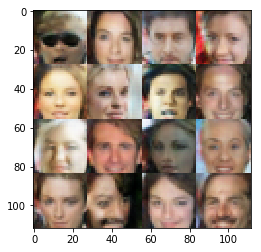

Epoch 4/5... Discriminator Loss: 1.6097... Generator Loss: 0.4543
Epoch 4/5... Discriminator Loss: 1.6036... Generator Loss: 0.3985
Epoch 4/5... Discriminator Loss: 1.7742... Generator Loss: 0.3197
Epoch 4/5... Discriminator Loss: 2.0766... Generator Loss: 0.2196
Epoch 4/5... Discriminator Loss: 1.4280... Generator Loss: 0.5833


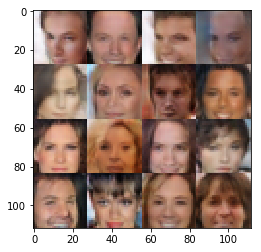

Epoch 4/5... Discriminator Loss: 1.4984... Generator Loss: 0.6700
Epoch 4/5... Discriminator Loss: 1.7279... Generator Loss: 0.3202
Epoch 4/5... Discriminator Loss: 1.6736... Generator Loss: 0.4049
Epoch 4/5... Discriminator Loss: 1.4357... Generator Loss: 0.5730
Epoch 4/5... Discriminator Loss: 1.4804... Generator Loss: 0.5783


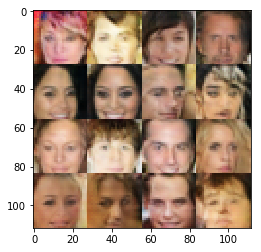

Epoch 4/5... Discriminator Loss: 1.9540... Generator Loss: 0.2195
Epoch 4/5... Discriminator Loss: 1.5014... Generator Loss: 0.5044
Epoch 4/5... Discriminator Loss: 1.6277... Generator Loss: 0.3456
Epoch 4/5... Discriminator Loss: 1.5644... Generator Loss: 0.6877
Epoch 4/5... Discriminator Loss: 1.6111... Generator Loss: 0.4144


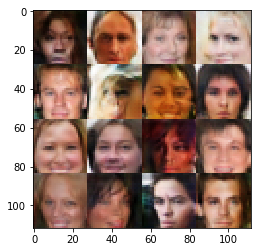

Epoch 4/5... Discriminator Loss: 1.7322... Generator Loss: 0.3210
Epoch 4/5... Discriminator Loss: 1.9309... Generator Loss: 0.2655
Epoch 4/5... Discriminator Loss: 1.9038... Generator Loss: 0.2615
Epoch 4/5... Discriminator Loss: 1.6900... Generator Loss: 0.4333
Epoch 4/5... Discriminator Loss: 1.9260... Generator Loss: 0.2509


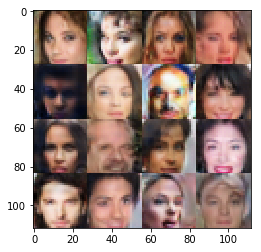

Epoch 4/5... Discriminator Loss: 1.6468... Generator Loss: 0.3824
Epoch 4/5... Discriminator Loss: 1.8073... Generator Loss: 0.3648
Epoch 4/5... Discriminator Loss: 1.9786... Generator Loss: 0.3072
Epoch 4/5... Discriminator Loss: 1.7428... Generator Loss: 0.3096
Epoch 4/5... Discriminator Loss: 1.6791... Generator Loss: 0.3973


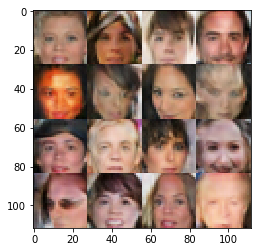

Epoch 4/5... Discriminator Loss: 1.6026... Generator Loss: 0.4223
Epoch 4/5... Discriminator Loss: 1.5871... Generator Loss: 0.4979
Epoch 4/5... Discriminator Loss: 1.4803... Generator Loss: 0.4423
Epoch 4/5... Discriminator Loss: 1.5690... Generator Loss: 0.5363
Epoch 4/5... Discriminator Loss: 1.7816... Generator Loss: 0.3287


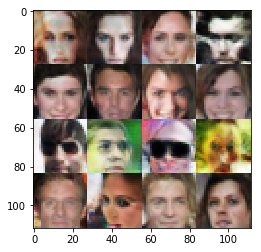

Epoch 4/5... Discriminator Loss: 1.5887... Generator Loss: 0.4918
Epoch 4/5... Discriminator Loss: 1.3523... Generator Loss: 0.6453
Epoch 4/5... Discriminator Loss: 1.4353... Generator Loss: 0.6500
Epoch 4/5... Discriminator Loss: 1.3862... Generator Loss: 0.4798
Epoch 4/5... Discriminator Loss: 1.6530... Generator Loss: 0.3507


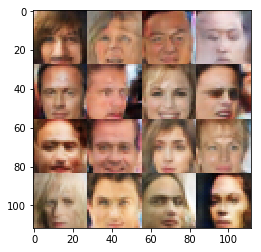

Epoch 4/5... Discriminator Loss: 1.3493... Generator Loss: 0.5732
Epoch 4/5... Discriminator Loss: 1.3804... Generator Loss: 0.5119
Epoch 4/5... Discriminator Loss: 1.3966... Generator Loss: 0.5464
Epoch 4/5... Discriminator Loss: 1.6452... Generator Loss: 0.4274
Epoch 4/5... Discriminator Loss: 1.5275... Generator Loss: 0.4493


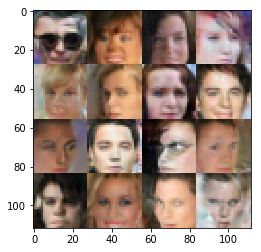

Epoch 4/5... Discriminator Loss: 1.4897... Generator Loss: 0.5425
Epoch 4/5... Discriminator Loss: 1.6319... Generator Loss: 0.4801
Epoch 4/5... Discriminator Loss: 1.4188... Generator Loss: 0.5714
Epoch 4/5... Discriminator Loss: 1.8392... Generator Loss: 0.3200
Epoch 4/5... Discriminator Loss: 1.5749... Generator Loss: 0.4354


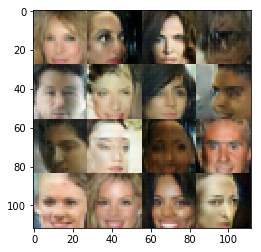

Epoch 4/5... Discriminator Loss: 1.5518... Generator Loss: 0.4387
Epoch 4/5... Discriminator Loss: 1.4164... Generator Loss: 0.6372
Epoch 4/5... Discriminator Loss: 1.7652... Generator Loss: 0.3693
Epoch 4/5... Discriminator Loss: 1.5498... Generator Loss: 0.4325
Epoch 4/5... Discriminator Loss: 2.0087... Generator Loss: 0.2355


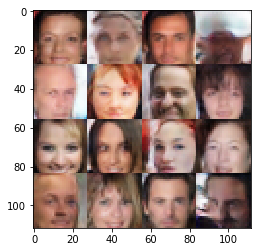

Epoch 4/5... Discriminator Loss: 1.6143... Generator Loss: 0.6437
Epoch 4/5... Discriminator Loss: 1.6797... Generator Loss: 0.3660
Epoch 4/5... Discriminator Loss: 2.0351... Generator Loss: 0.2667
Epoch 4/5... Discriminator Loss: 1.8091... Generator Loss: 0.2508
Epoch 4/5... Discriminator Loss: 1.7195... Generator Loss: 0.5322


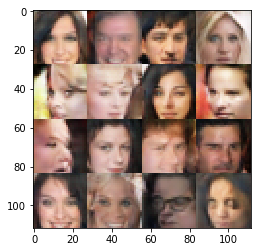

Epoch 4/5... Discriminator Loss: 1.5424... Generator Loss: 0.5577
Epoch 4/5... Discriminator Loss: 1.8331... Generator Loss: 0.2994
Epoch 4/5... Discriminator Loss: 1.5803... Generator Loss: 0.4779
Epoch 4/5... Discriminator Loss: 1.4360... Generator Loss: 0.4530
Epoch 4/5... Discriminator Loss: 1.6802... Generator Loss: 0.3508


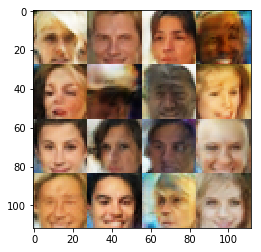

Epoch 4/5... Discriminator Loss: 1.5726... Generator Loss: 0.4744
Epoch 4/5... Discriminator Loss: 1.5818... Generator Loss: 0.3640
Epoch 4/5... Discriminator Loss: 1.8105... Generator Loss: 0.3222
Epoch 4/5... Discriminator Loss: 1.5778... Generator Loss: 0.3668
Epoch 4/5... Discriminator Loss: 2.0268... Generator Loss: 0.2286


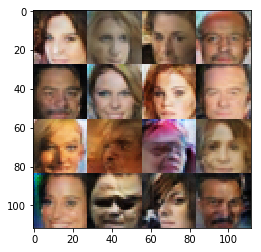

Epoch 4/5... Discriminator Loss: 1.9521... Generator Loss: 0.2613
Epoch 4/5... Discriminator Loss: 2.1055... Generator Loss: 0.2082
Epoch 4/5... Discriminator Loss: 1.5343... Generator Loss: 0.6077
Epoch 4/5... Discriminator Loss: 1.7531... Generator Loss: 0.4567
Epoch 4/5... Discriminator Loss: 1.5244... Generator Loss: 0.5091


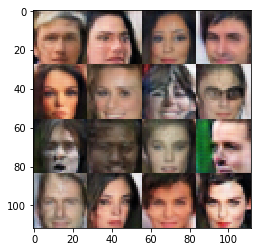

Epoch 4/5... Discriminator Loss: 1.6998... Generator Loss: 0.4259
Epoch 4/5... Discriminator Loss: 1.9170... Generator Loss: 0.2553
Epoch 4/5... Discriminator Loss: 1.6613... Generator Loss: 0.3484
Epoch 5/5... Discriminator Loss: 1.4336... Generator Loss: 0.5363
Epoch 5/5... Discriminator Loss: 1.6907... Generator Loss: 0.3504


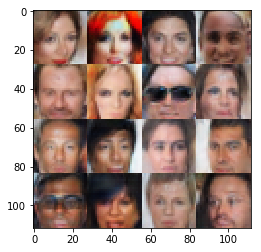

Epoch 5/5... Discriminator Loss: 1.2023... Generator Loss: 0.9471
Epoch 5/5... Discriminator Loss: 1.8158... Generator Loss: 0.3143
Epoch 5/5... Discriminator Loss: 1.6554... Generator Loss: 0.3427
Epoch 5/5... Discriminator Loss: 1.4479... Generator Loss: 0.6412
Epoch 5/5... Discriminator Loss: 1.8119... Generator Loss: 0.3640


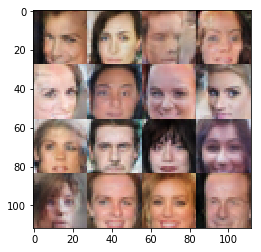

Epoch 5/5... Discriminator Loss: 1.9212... Generator Loss: 0.2757
Epoch 5/5... Discriminator Loss: 1.6534... Generator Loss: 0.4358
Epoch 5/5... Discriminator Loss: 2.0205... Generator Loss: 0.2671
Epoch 5/5... Discriminator Loss: 1.7630... Generator Loss: 0.2866
Epoch 5/5... Discriminator Loss: 1.3272... Generator Loss: 0.6349


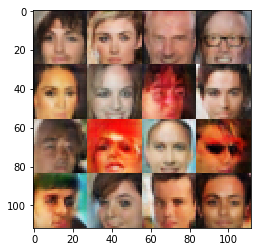

Epoch 5/5... Discriminator Loss: 1.6515... Generator Loss: 0.4351
Epoch 5/5... Discriminator Loss: 1.9333... Generator Loss: 0.2461
Epoch 5/5... Discriminator Loss: 1.4811... Generator Loss: 0.4960
Epoch 5/5... Discriminator Loss: 1.6133... Generator Loss: 0.4157
Epoch 5/5... Discriminator Loss: 1.5902... Generator Loss: 0.4545


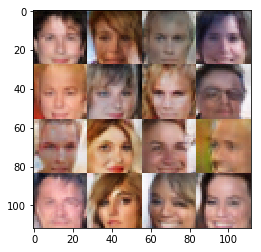

Epoch 5/5... Discriminator Loss: 1.8464... Generator Loss: 0.3444
Epoch 5/5... Discriminator Loss: 1.5574... Generator Loss: 0.4711
Epoch 5/5... Discriminator Loss: 1.6385... Generator Loss: 0.3431
Epoch 5/5... Discriminator Loss: 1.4450... Generator Loss: 0.6440
Epoch 5/5... Discriminator Loss: 1.6015... Generator Loss: 0.4005


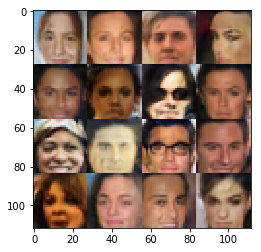

Epoch 5/5... Discriminator Loss: 1.9163... Generator Loss: 0.2510
Epoch 5/5... Discriminator Loss: 1.6626... Generator Loss: 0.6179
Epoch 5/5... Discriminator Loss: 1.3266... Generator Loss: 0.5802
Epoch 5/5... Discriminator Loss: 1.7492... Generator Loss: 0.2980
Epoch 5/5... Discriminator Loss: 1.9537... Generator Loss: 0.2238


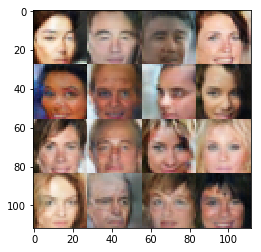

Epoch 5/5... Discriminator Loss: 1.7045... Generator Loss: 0.3452
Epoch 5/5... Discriminator Loss: 1.7310... Generator Loss: 0.4444
Epoch 5/5... Discriminator Loss: 1.6057... Generator Loss: 0.5123
Epoch 5/5... Discriminator Loss: 1.4255... Generator Loss: 0.4400
Epoch 5/5... Discriminator Loss: 2.2564... Generator Loss: 0.1573


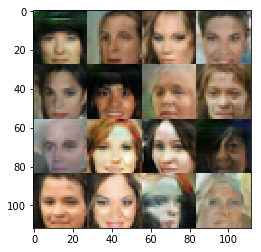

Epoch 5/5... Discriminator Loss: 1.7358... Generator Loss: 0.5462
Epoch 5/5... Discriminator Loss: 1.9195... Generator Loss: 0.2505
Epoch 5/5... Discriminator Loss: 1.5857... Generator Loss: 0.4222
Epoch 5/5... Discriminator Loss: 1.5527... Generator Loss: 0.4102
Epoch 5/5... Discriminator Loss: 1.4792... Generator Loss: 0.4668


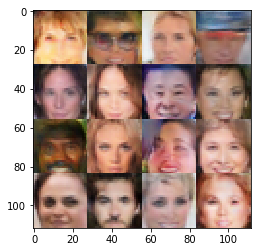

Epoch 5/5... Discriminator Loss: 1.6549... Generator Loss: 0.3718
Epoch 5/5... Discriminator Loss: 1.4200... Generator Loss: 0.7095
Epoch 5/5... Discriminator Loss: 1.4228... Generator Loss: 0.5326
Epoch 5/5... Discriminator Loss: 1.8351... Generator Loss: 0.3032
Epoch 5/5... Discriminator Loss: 1.6042... Generator Loss: 0.3674


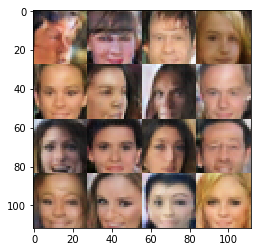

Epoch 5/5... Discriminator Loss: 1.8094... Generator Loss: 0.3230
Epoch 5/5... Discriminator Loss: 1.8841... Generator Loss: 0.2819
Epoch 5/5... Discriminator Loss: 1.3883... Generator Loss: 0.5328
Epoch 5/5... Discriminator Loss: 1.6504... Generator Loss: 0.3505
Epoch 5/5... Discriminator Loss: 1.3899... Generator Loss: 0.6810


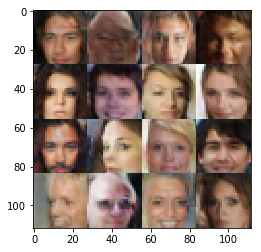

Epoch 5/5... Discriminator Loss: 1.9783... Generator Loss: 0.2530
Epoch 5/5... Discriminator Loss: 1.7235... Generator Loss: 0.3869
Epoch 5/5... Discriminator Loss: 1.6154... Generator Loss: 0.4264
Epoch 5/5... Discriminator Loss: 1.7092... Generator Loss: 0.4412
Epoch 5/5... Discriminator Loss: 1.7758... Generator Loss: 0.3322


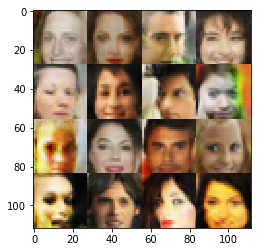

Epoch 5/5... Discriminator Loss: 1.8388... Generator Loss: 0.3427
Epoch 5/5... Discriminator Loss: 1.6749... Generator Loss: 0.3176
Epoch 5/5... Discriminator Loss: 1.8718... Generator Loss: 0.2849
Epoch 5/5... Discriminator Loss: 1.4645... Generator Loss: 0.5406
Epoch 5/5... Discriminator Loss: 1.6498... Generator Loss: 0.3461


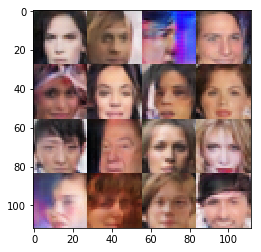

Epoch 5/5... Discriminator Loss: 1.4267... Generator Loss: 0.5727
Epoch 5/5... Discriminator Loss: 1.8748... Generator Loss: 0.3183
Epoch 5/5... Discriminator Loss: 1.7179... Generator Loss: 0.3699
Epoch 5/5... Discriminator Loss: 1.6152... Generator Loss: 0.4983
Epoch 5/5... Discriminator Loss: 1.8312... Generator Loss: 0.2780


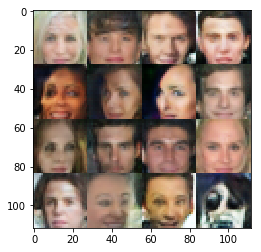

Epoch 5/5... Discriminator Loss: 1.6965... Generator Loss: 0.3925
Epoch 5/5... Discriminator Loss: 1.7462... Generator Loss: 0.3627
Epoch 5/5... Discriminator Loss: 1.7039... Generator Loss: 0.5632
Epoch 5/5... Discriminator Loss: 1.7998... Generator Loss: 0.3017
Epoch 5/5... Discriminator Loss: 1.4998... Generator Loss: 0.4777


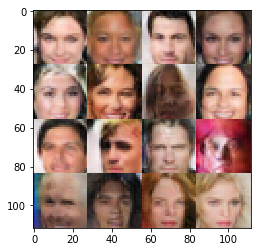

Epoch 5/5... Discriminator Loss: 1.6317... Generator Loss: 0.3924
Epoch 5/5... Discriminator Loss: 1.4277... Generator Loss: 0.5978
Epoch 5/5... Discriminator Loss: 1.8143... Generator Loss: 0.3131
Epoch 5/5... Discriminator Loss: 1.4666... Generator Loss: 0.5573
Epoch 5/5... Discriminator Loss: 1.8929... Generator Loss: 0.2765


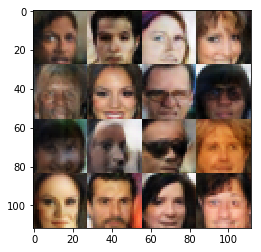

Epoch 5/5... Discriminator Loss: 1.4354... Generator Loss: 0.5094
Epoch 5/5... Discriminator Loss: 1.9389... Generator Loss: 0.2637
Epoch 5/5... Discriminator Loss: 1.5730... Generator Loss: 0.4722
Epoch 5/5... Discriminator Loss: 1.5755... Generator Loss: 0.3395
Epoch 5/5... Discriminator Loss: 1.7884... Generator Loss: 0.2930


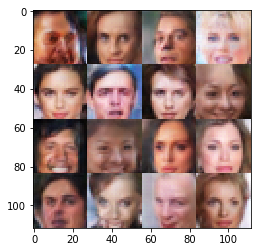

Epoch 5/5... Discriminator Loss: 1.5696... Generator Loss: 0.3723
Epoch 5/5... Discriminator Loss: 1.7065... Generator Loss: 0.4212
Epoch 5/5... Discriminator Loss: 1.6510... Generator Loss: 0.3531
Epoch 5/5... Discriminator Loss: 1.7865... Generator Loss: 0.3172
Epoch 5/5... Discriminator Loss: 1.3428... Generator Loss: 0.5908


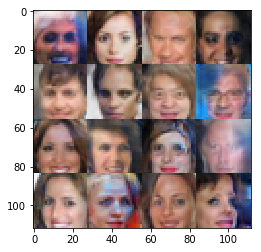

Epoch 5/5... Discriminator Loss: 1.6994... Generator Loss: 0.3800
Epoch 5/5... Discriminator Loss: 1.7689... Generator Loss: 0.3890
Epoch 5/5... Discriminator Loss: 1.5998... Generator Loss: 0.6055
Epoch 5/5... Discriminator Loss: 2.0197... Generator Loss: 0.2680
Epoch 5/5... Discriminator Loss: 1.7105... Generator Loss: 0.3319


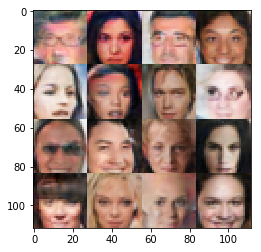

Epoch 5/5... Discriminator Loss: 1.9339... Generator Loss: 0.2899
Epoch 5/5... Discriminator Loss: 1.5554... Generator Loss: 0.5259
Epoch 5/5... Discriminator Loss: 2.0351... Generator Loss: 0.2619
Epoch 5/5... Discriminator Loss: 1.6543... Generator Loss: 0.3452
Epoch 5/5... Discriminator Loss: 1.3814... Generator Loss: 0.5977


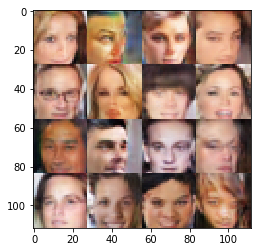

Epoch 5/5... Discriminator Loss: 1.7438... Generator Loss: 0.3533
Epoch 5/5... Discriminator Loss: 1.4019... Generator Loss: 0.4959
Epoch 5/5... Discriminator Loss: 1.7893... Generator Loss: 0.2664
Epoch 5/5... Discriminator Loss: 1.5676... Generator Loss: 0.4805
Epoch 5/5... Discriminator Loss: 1.6463... Generator Loss: 0.3611


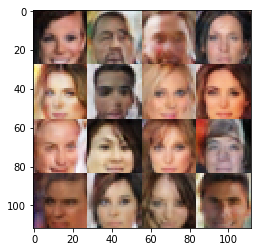

Epoch 5/5... Discriminator Loss: 2.3859... Generator Loss: 0.1393
Epoch 5/5... Discriminator Loss: 1.7077... Generator Loss: 0.3679
Epoch 5/5... Discriminator Loss: 1.8349... Generator Loss: 0.4123
Epoch 5/5... Discriminator Loss: 1.7209... Generator Loss: 0.3498
Epoch 5/5... Discriminator Loss: 2.0209... Generator Loss: 0.2370


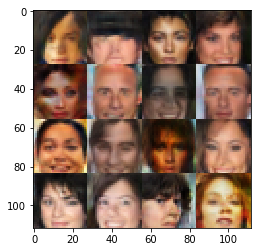

Epoch 5/5... Discriminator Loss: 1.8724... Generator Loss: 0.3262
Epoch 5/5... Discriminator Loss: 1.9914... Generator Loss: 0.2809
Epoch 5/5... Discriminator Loss: 1.5289... Generator Loss: 0.5456
Epoch 5/5... Discriminator Loss: 1.4382... Generator Loss: 0.7769
Epoch 5/5... Discriminator Loss: 1.7531... Generator Loss: 0.4884


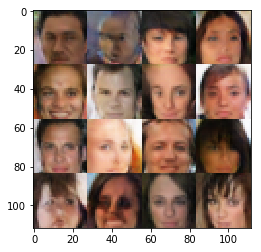

Epoch 5/5... Discriminator Loss: 1.6132... Generator Loss: 0.4438
Epoch 5/5... Discriminator Loss: 1.7223... Generator Loss: 0.3475
Epoch 5/5... Discriminator Loss: 1.5050... Generator Loss: 0.4411
Epoch 5/5... Discriminator Loss: 1.6958... Generator Loss: 0.4018
Epoch 5/5... Discriminator Loss: 1.8250... Generator Loss: 0.3314


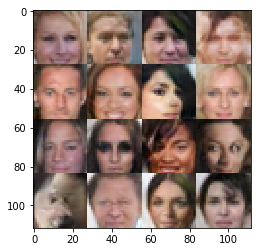

Epoch 5/5... Discriminator Loss: 1.4775... Generator Loss: 0.5044
Epoch 5/5... Discriminator Loss: 1.5612... Generator Loss: 0.5367
Epoch 5/5... Discriminator Loss: 1.9363... Generator Loss: 0.2247
Epoch 5/5... Discriminator Loss: 1.8686... Generator Loss: 0.2916
Epoch 5/5... Discriminator Loss: 1.6535... Generator Loss: 0.4541


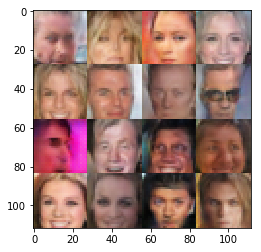

Epoch 5/5... Discriminator Loss: 1.7962... Generator Loss: 0.3400
Epoch 5/5... Discriminator Loss: 1.9668... Generator Loss: 0.2825
Epoch 5/5... Discriminator Loss: 2.0264... Generator Loss: 0.2321
Epoch 5/5... Discriminator Loss: 1.5196... Generator Loss: 0.5471
Epoch 5/5... Discriminator Loss: 1.4968... Generator Loss: 0.5503


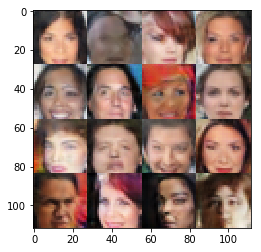

Epoch 5/5... Discriminator Loss: 1.5204... Generator Loss: 0.6242
Epoch 5/5... Discriminator Loss: 1.5856... Generator Loss: 0.4444
Epoch 5/5... Discriminator Loss: 1.5533... Generator Loss: 0.3661
Epoch 5/5... Discriminator Loss: 1.3382... Generator Loss: 0.5756
Epoch 5/5... Discriminator Loss: 1.3354... Generator Loss: 0.6723


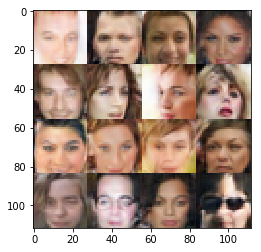

Epoch 5/5... Discriminator Loss: 1.6795... Generator Loss: 0.3957
Epoch 5/5... Discriminator Loss: 1.7203... Generator Loss: 0.4119
Epoch 5/5... Discriminator Loss: 1.8155... Generator Loss: 0.3280
Epoch 5/5... Discriminator Loss: 1.5953... Generator Loss: 0.3695
Epoch 5/5... Discriminator Loss: 1.9742... Generator Loss: 0.2727


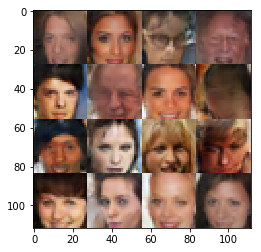

Epoch 5/5... Discriminator Loss: 1.5933... Generator Loss: 0.4329
Epoch 5/5... Discriminator Loss: 1.8858... Generator Loss: 0.2608
Epoch 5/5... Discriminator Loss: 1.8492... Generator Loss: 0.3259
Epoch 5/5... Discriminator Loss: 1.7935... Generator Loss: 0.3621
Epoch 5/5... Discriminator Loss: 1.9616... Generator Loss: 0.2777


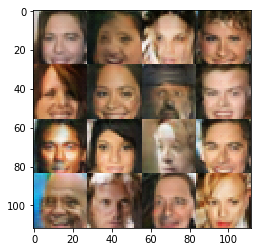

Epoch 5/5... Discriminator Loss: 1.9020... Generator Loss: 0.3171
Epoch 5/5... Discriminator Loss: 2.1371... Generator Loss: 0.2028
Epoch 5/5... Discriminator Loss: 1.3909... Generator Loss: 0.5121
Epoch 5/5... Discriminator Loss: 1.5311... Generator Loss: 0.7374
Epoch 5/5... Discriminator Loss: 1.6362... Generator Loss: 0.4324


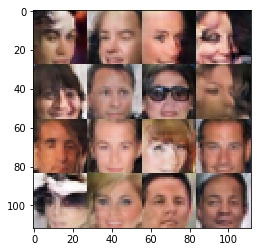

Epoch 5/5... Discriminator Loss: 1.8601... Generator Loss: 0.2785
Epoch 5/5... Discriminator Loss: 1.4837... Generator Loss: 0.5728
Epoch 5/5... Discriminator Loss: 2.3223... Generator Loss: 0.1786
Epoch 5/5... Discriminator Loss: 1.8282... Generator Loss: 0.3263
Epoch 5/5... Discriminator Loss: 1.9943... Generator Loss: 0.2596


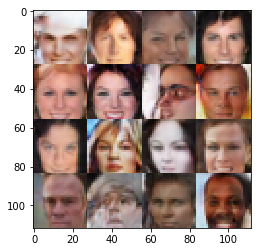

Epoch 5/5... Discriminator Loss: 1.4496... Generator Loss: 0.5882
Epoch 5/5... Discriminator Loss: 1.5237... Generator Loss: 0.5054
Epoch 5/5... Discriminator Loss: 1.5680... Generator Loss: 0.4744
Epoch 5/5... Discriminator Loss: 1.9725... Generator Loss: 0.2764
Epoch 5/5... Discriminator Loss: 2.0732... Generator Loss: 0.2079


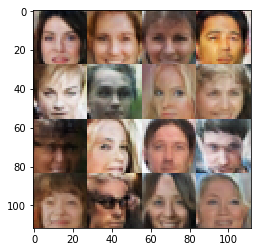

Epoch 5/5... Discriminator Loss: 1.6421... Generator Loss: 0.3436
Epoch 5/5... Discriminator Loss: 1.8577... Generator Loss: 0.2767
Epoch 5/5... Discriminator Loss: 1.5621... Generator Loss: 0.7101
Epoch 5/5... Discriminator Loss: 1.6063... Generator Loss: 0.5204
Epoch 5/5... Discriminator Loss: 1.9431... Generator Loss: 0.2664


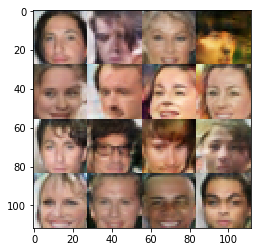

Epoch 5/5... Discriminator Loss: 1.4604... Generator Loss: 0.5162


In [18]:
batch_size = 64
z_dim = 100
learning_rate = 0.001
beta1 = 0.5

epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode, show_every = 100, print_every = 20 )